In [1]:
import matplotlib.pyplot as plt
import wntr
import wntr.network.controls as controls
import csv
import time
import pandas as pd
import numpy as np
from datetime import datetime
import glob

import seaborn as sns
import tikzplotlib

In [133]:
def do_subplot(series, variable_names, legends, titles, sub_filename='do_subplot', y_label='water level in tank (m)', xlim=None, ylim=None, markers=None):
    sns.set_style("whitegrid")
    subplot_n_columns = 1
    
    if not xlim:
        xlim = [0, 1728]
    time =  np.arange(xlim[0], xlim[1])
    
    if len(variable_names) == 1:
        subplot_n_rows = 1
    elif len(variable_names) % 2 == 0:
        subplot_n_rows = int((len(variable_names)/subplot_n_columns))
    else:    
        subplot_n_rows = int((len(variable_names)/subplot_n_columns) + 1)
    
    #ticks = np.arange(xlim[0], xlim[1], step=288)
    #ticks_labels = ['Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00']
    
    # Builds subplot grid
    f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (20,15), squeeze=False, dpi=80, sharex=True)
    
    # sharex='all', sharey='all'
    
    subplot_row = 0
    subplot_column = 0    
    i = 0    
    for variable in variable_names:
        j = 0
        for serie in series:
            axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], linestyle='None', marker = markers[j])
            j = j + 1                    
            
        if i== 1:
            axes[subplot_row][subplot_column].legend(loc='lower right')
            
        axes[subplot_row][subplot_column].grid(True)
        axes[subplot_row][subplot_column].set_title(titles[i])
        axes[subplot_row][subplot_column].set_ylabel(y_label)             

        #axes[subplot_row][subplot_column].set_xticks(ticks)
        #axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)
    
        if xlim:
            axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
        if ylim:
            axes[subplot_row][subplot_column].set_ylim(bottom=ylim[0], top=ylim[1])                            
            
        subplot_column = subplot_column + 1
        if subplot_column >= subplot_n_columns:
            subplot_column = 0
            subplot_row = subplot_row + 1
  
        i = i +1
            
    plt.savefig(sub_filename+'.png', orientation='landscape')
    plt.savefig(sub_filename+'.pdf', orientation='landscape')
        
    font = {'family' : 'normal',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

In [3]:
def test_subplot(series, variable_names, legends, plot_colors, test_file_name, titles, xlim=None, linestyles=None, markers=None):
    sns.set_style("whitegrid")
    subplot_n_columns = 1
    
    if len(variable_names) == 1:
        subplot_n_rows = 1
    elif len(variable_names) % 2 == 0:
        subplot_n_rows = int((len(variable_names)/subplot_n_columns))
    else:    
        subplot_n_rows = int((len(variable_names)/subplot_n_columns) + 1)
    
    ticks = np.arange(0, 1728, step=288)
    ticks_labels = ['Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00']
    
    # Builds subplot grid
    f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (20,15), squeeze=False, dpi=80, sharex=True)
    
    # sharex='all', sharey='all'
    
    subplot_row = 0
    subplot_column = 0
    i = 0    
    for variable in variable_names:
        j = 0
        for serie in series:
            if markers:                
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], color=plot_colors[j], linestyle='None', marker=markers[j])
            else:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], color=plot_colors[j])
            j = j + 1

        if i== 1:
            axes[subplot_row][subplot_column].legend(loc='lower right')
            
        axes[subplot_row][subplot_column].grid(True)
        axes[subplot_row][subplot_column].set_title(titles[i])
        #axes[subplot_row][subplot_column].set_xlabel('Iterations')
        axes[subplot_row][subplot_column].set_ylabel('water level in tank (m)')             

        axes[subplot_row][subplot_column].set_xticks(ticks)
        axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)

        
        if xlim:
            axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                    

        attack_begin_line = 648
        attack_end_line = 792

        #axes[subplot_row][subplot_column].axhline(y=0,linewidth=1.0, c='gray')                                
        #axes[subplot_row][subplot_column].plot([638, 648],  [0, -0.50], 'gray')
        #axes[subplot_row][subplot_column].plot([802, 792], [0, -0.50], 'gray')
        #axes[subplot_row][subplot_column].axhline(y=-0.50,xmin=attack_begin_line, xmax=attack_end_line, zorder=0, c='gray')                                
        #axes[subplot_row][subplot_column].fill_between([638,802], [0.25,0.25], alpha=0.4, color='gray')
        #axes[subplot_row][subplot_column].fill_between([638,802], [-0.3,-0.3], alpha=0.4, color='gray')
        
        
        #axes[subplot_row][subplot_column].plot([648, 648],  [0, 11], 'red')
        #axes[subplot_row][subplot_column].plot([792, 792],  [0, 11], 'red')
        axes[subplot_row][subplot_column].axvspan(attack_begin_line, attack_end_line, facecolor='gray', alpha=.2)
        
        subplot_column = subplot_column + 1
        if subplot_column >= subplot_n_columns:
            subplot_column = 0
            subplot_row = subplot_row + 1
  
        i = i +1
        
    
    plt.savefig(test_file_name+'.png', orientation='landscape')
    plt.savefig(test_file_name+'.pdf', orientation='landscape')
    
    #tikzplotlib.clean_figure()
    #tikzplotlib.save(file_name+'.tex')
    
    
    font = {'family' : 'normal',
            'weight' : 'normal',
            'size'   : 18}

    plt.rc('font', **font)    

In [4]:
def plot_with_envelope(series, variable_names, legends, envelope_min, envelope_max, plot_colors, env_file_name, titles, xlim=None, linestyles=None, markers=None):
    sns.set_style("whitegrid")
    subplot_n_columns = 1
    
    if not xlim:
        xlim = [0, 1728]
    time =  np.arange(xlim[0], xlim[1])
    
    if len(variable_names) == 1:
        subplot_n_rows = 1
    elif len(variable_names) % 2 == 0:
        subplot_n_rows = int((len(variable_names)/subplot_n_columns))
    else:    
        subplot_n_rows = int((len(variable_names)/subplot_n_columns) + 1)
    
    ticks = np.arange(xlim[0], xlim[1], step=288)
    ticks_labels = ['Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00']
    
    # Builds subplot grid
    f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (20,15), squeeze=False, dpi=80, sharex=True)
    
    # sharex='all', sharey='all'
    
    subplot_row = 0
    subplot_column = 0
    i = 0    
    for variable in variable_names:
        j = 0
        for serie in series:
            if markers:                
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], color=plot_colors[j], linestyle='None', marker=markers[j])
            else:
                axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], color=plot_colors[j])
            j = j + 1

            
        axes[subplot_row][subplot_column].fill_between(time, envelope_min[i][xlim[0]:xlim[1]], envelope_max[i][xlim[0]:xlim[1]], alpha=0.2, color='gray')
            
        if i== 1:
            axes[subplot_row][subplot_column].legend(loc='lower right')
            
        axes[subplot_row][subplot_column].grid(True)
        axes[subplot_row][subplot_column].set_title(titles[i])
        axes[subplot_row][subplot_column].set_ylabel('water level in tank (m)')             

        axes[subplot_row][subplot_column].set_xticks(ticks)
        axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)
    
        if xlim:
            axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
        subplot_column = subplot_column + 1
        if subplot_column >= subplot_n_columns:
            subplot_column = 0
            subplot_row = subplot_row + 1
  
        i = i +1
            
    plt.savefig(env_file_name+'.png', orientation='landscape')
    plt.savefig(env_file_name+'.pdf', orientation='landscape')
        
    font = {'family' : 'normal',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

## Anytown - Default PLC Configuration - Modified INP File - Generated Demmand Pattern [0.3 - 1.0]

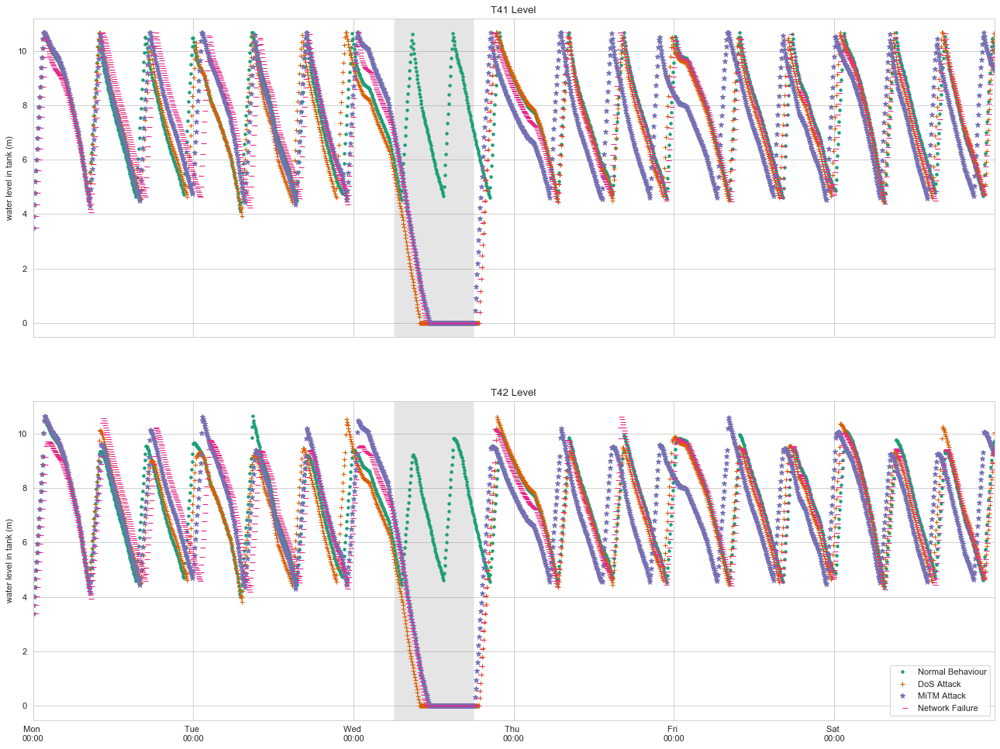

In [5]:
anytown_normal_behaviour = pd.read_csv('normal_operation/normal_operation_1/output/ground_truth.csv')
dos_attack_plc2 = pd.read_csv('dos_test_plc2/ground_truth.csv')
dos_attack_plc1 = pd.read_csv('dos_test_plc1/ground_truth.csv')

mitm_attack_plc1 = pd.read_csv('mitm_test_plc1/ground_truth.csv')
nwk_event_loss_100_12_hours = pd.read_csv('nwk_event_loss_100_12_hours/ground_truth.csv')

############### Known Events #################################
tanks = ['T41_LEVEL', 'T42_LEVEL']
series = [anytown_normal_behaviour, dos_attack_plc1, mitm_attack_plc1, nwk_event_loss_100_12_hours] 
colors = ['#1b9e77','#d95f02', '#7570b3', '#e7298a',  '#66a61e']

file_name = 'normal_behaviour_original_skip'
title = ['T41 Level', 'T42 Level']
lines = [None, None, None, None ]
makers = ['.', '+', '*', 1]
test_subplot(series, tanks, ['Normal Behaviour', 'DoS Attack', 'MiTM Attack', 'Network Failure'], colors, file_name, title, [0,1728], lines, makers)

In [6]:
t_41 = pd.concat([pd.Series(series[0]['T41_LEVEL'][0:1995].values),
                pd.Series(series[1]['T41_LEVEL'][0:1995].values),                          
                                    pd.Series(series[2]['T41_LEVEL'][0:1995].values),
                                              pd.Series(series[3]['T41_LEVEL'][0:1995].values)], axis=1)
t_41.columns=['Normal', 'DoS', 'MiTM', 'Network']

t_42 = pd.concat([pd.Series(series[0]['T42_LEVEL'][0:1995].values),
                pd.Series(series[1]['T42_LEVEL'][0:1995].values),                          
                                    pd.Series(series[2]['T42_LEVEL'][0:1995].values),
                                              pd.Series(series[3]['T42_LEVEL'][0:1995].values)], axis=1)
t_42.columns=['Normal', 'DoS', 'MiTM', 'Network']

t_41_mean = t_41.mean(axis=1)
t_41_std = t_41.std(axis=1)

t_42_mean = t_42.mean(axis=1)
t_42_std = t_42.std(axis=1)

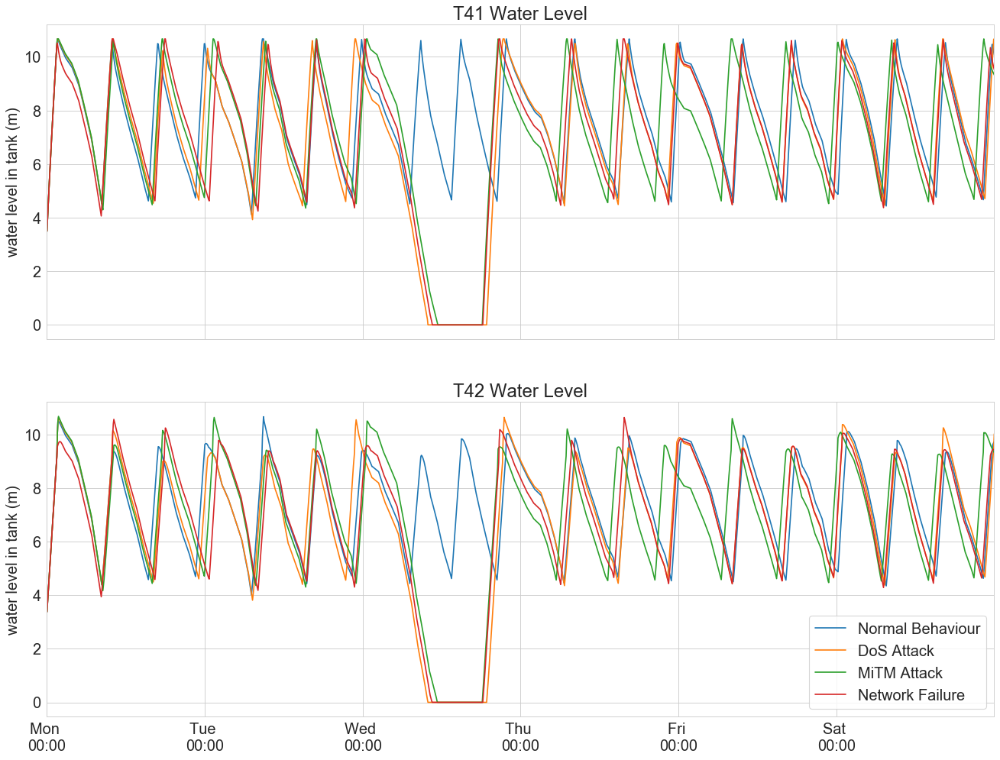

In [7]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([anytown_normal_behaviour, dos_attack_plc1, mitm_attack_plc1, nwk_event_loss_100_12_hours], tanks,
           ['Normal Behaviour', 'DoS Attack', 'MiTM Attack', 'Network Failure'], titles = ['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'anomalies_tank_levels', y_label='water level in tank (m)', xlim=[0,1728])

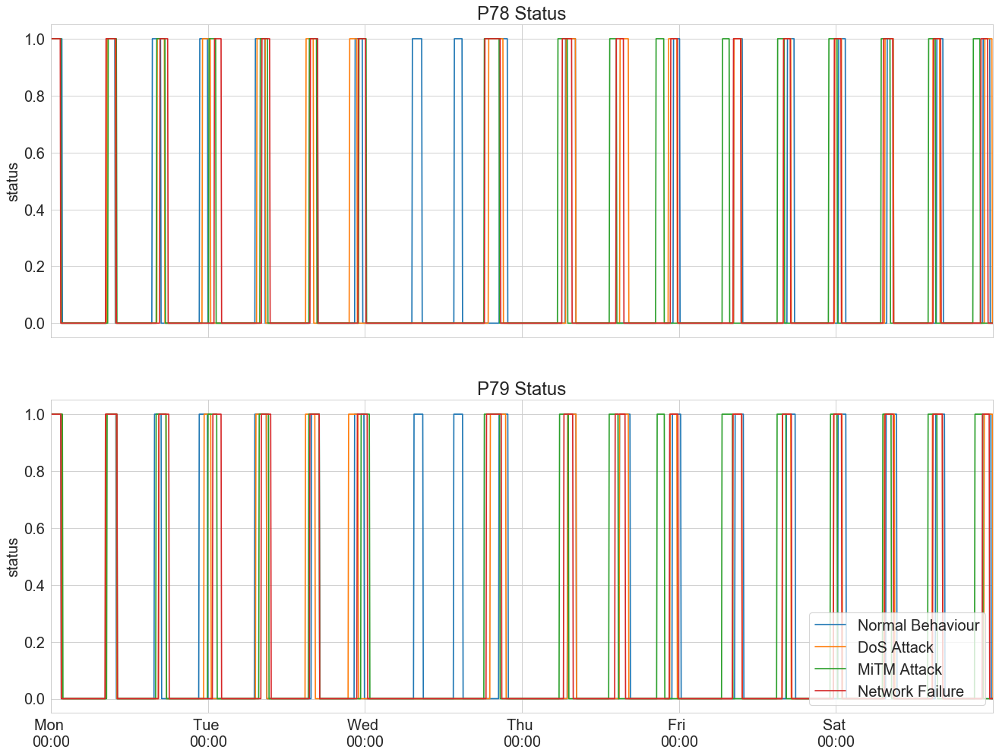

In [8]:
tanks = ['P78_STATUS', 'P79_STATUS']
do_subplot([anytown_normal_behaviour, dos_attack_plc1, mitm_attack_plc1, nwk_event_loss_100_12_hours], tanks, 
           ['Normal Behaviour', 'DoS Attack', 'MiTM Attack', 'Network Failure'], sub_filename = 'anomalies_pump_status',
           titles = ['P78 Status', 'P79 Status'], y_label = 'status', xlim = [0,1728])

# Error Plot for Normal Operations Anytown

We are trying to figure out why the results look a little different between no events and events

In [9]:
folder_prefix = 'normal_operation/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)
normal_operation_runs = []
for file in paths:     
    normal_operation_runs.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
# We are in a rush, later find an elegant solution
normal_t41 = pd.concat([pd.Series(normal_operation_runs[0]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[1]['T41_LEVEL'][0:1997].values),                          
                        pd.Series(normal_operation_runs[2]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[3]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[4]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[5]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[6]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[7]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[8]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[9]['T41_LEVEL'][0:1997].values)],axis=1)
normal_t41.index.name = 'Iteration'

# We are in a rush, later find an elegant solution
normal_t42 = pd.concat([pd.Series(normal_operation_runs[0]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[1]['T42_LEVEL'][0:1997].values),                          
                        pd.Series(normal_operation_runs[2]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[3]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[4]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[5]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[6]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[7]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[8]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs[9]['T42_LEVEL'][0:1997].values)],axis=1)
normal_t42.index.name = 'Iteration'

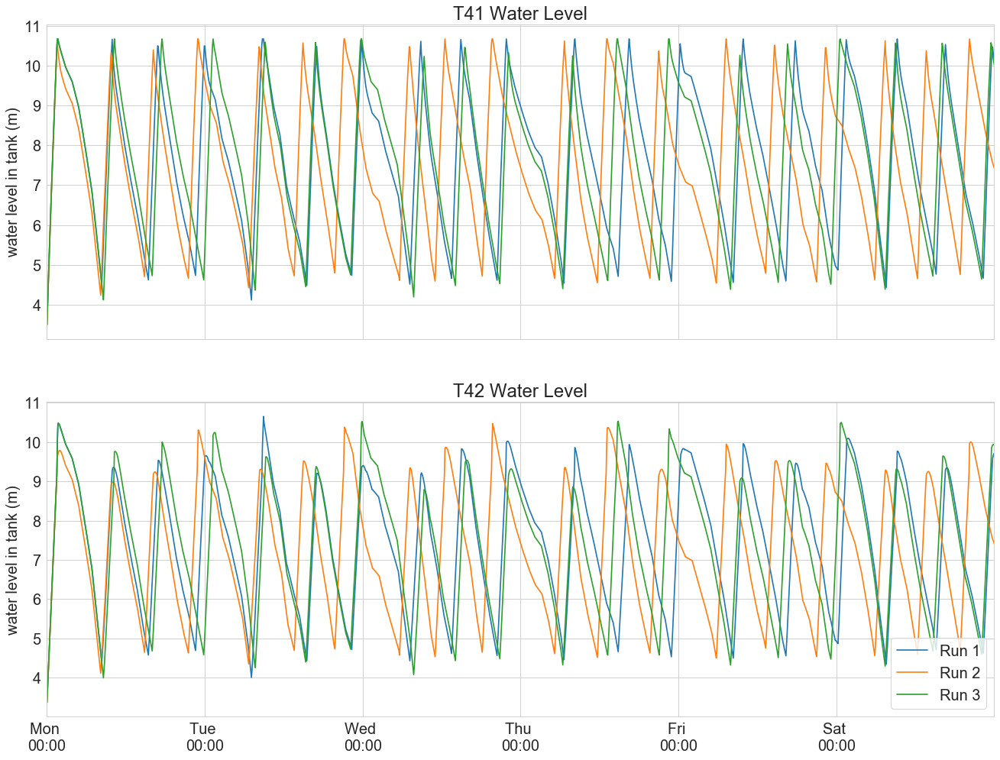

In [10]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([normal_operation_runs[0], normal_operation_runs[1], normal_operation_runs[2]], tanks, 
           ['Run 1', 'Run 2', 'Run 3'],  ['T41 Water Level', 'T42 Water Level'], sub_filename = 'normal_operation_conditions_runs', 
           y_label='water level in tank (m)', xlim = [0,1728])

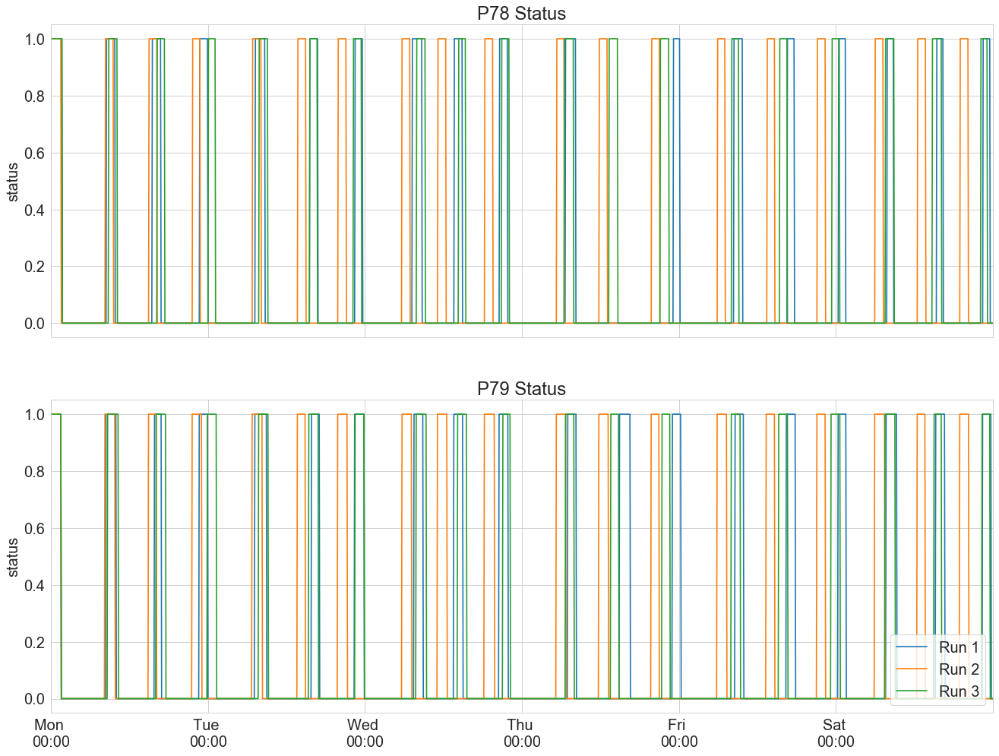

In [11]:
pumps = ['P78_STATUS', 'P79_STATUS']
do_subplot([normal_operation_runs[0], normal_operation_runs[1], normal_operation_runs[2]], pumps,
           ['Run 1', 'Run 2', 'Run 3'],  ['P78 Status', 'P79 Status'], sub_filename = 'normal_operation_conditions_runs_pumps',
           y_label = 'status', xlim = [0,1728])

In [12]:
maximum_t41 = normal_t41.max(axis=1)
mininum_t41 = normal_t41.min(axis=1)
mean_t41 = normal_t41.mean(axis=1)

maximum_t42 = normal_t42.max(axis=1)
mininum_t42 = normal_t42.min(axis=1)
mean_t42 = normal_t42.mean(axis=1)

# Envelope of Variability

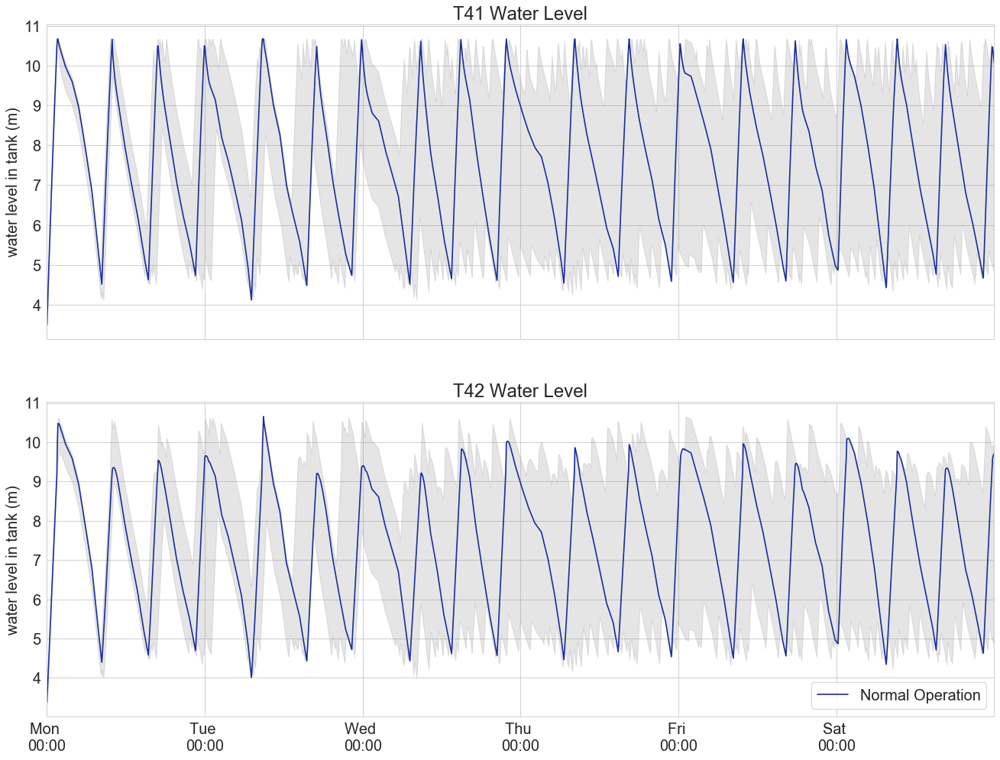

In [13]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([anytown_normal_behaviour], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], [mininum_t41,mininum_t42] , [maximum_t41, maximum_t42], 
                    plot_colors, 'envelope_original_skip', ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

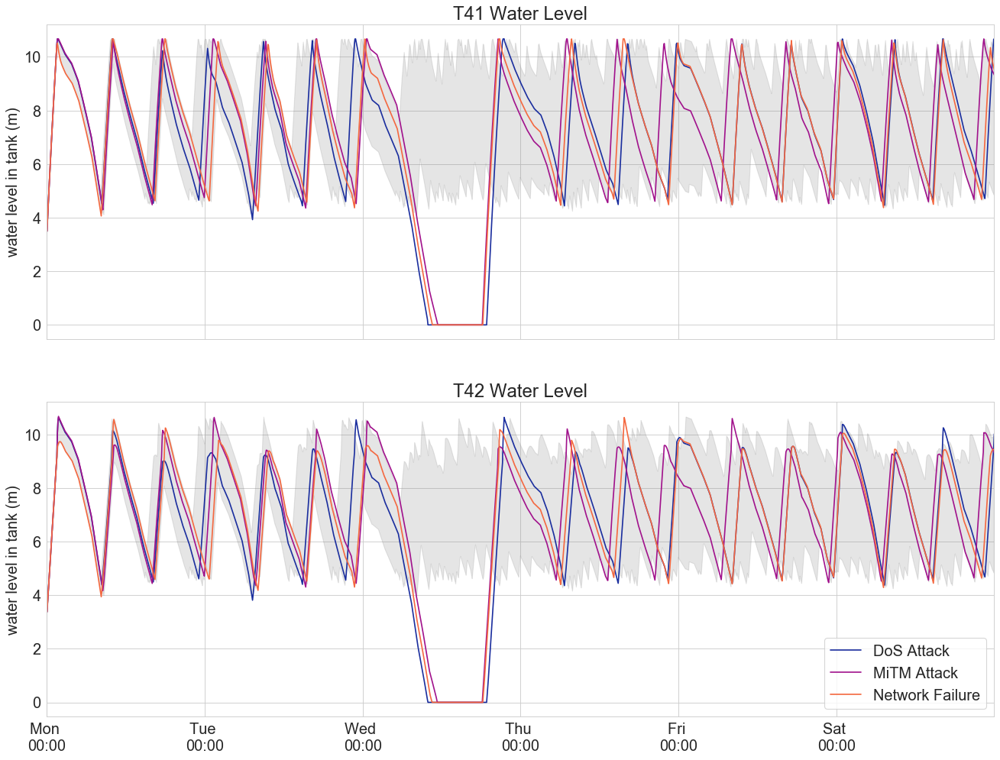

In [14]:
plot_colors = ['#1b2e9e', '#a1128c', '#f46840' , '#d4f482' ]
series = [dos_attack_plc1, mitm_attack_plc1, nwk_event_loss_100_12_hours] 
file_name = 'envelope_with_attacks_original_skip'
title = ['T41 Level', 'T42 Level']
plot_with_envelope(series, ['T41_LEVEL', 'T42_LEVEL'], ['DoS Attack', 'MiTM Attack', 'Network Failure'], [mininum_t41, mininum_t42], [maximum_t41,maximum_t42], 
                    plot_colors, file_name, ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

# Comparison with Anytown - WNTR

In [15]:
folder_prefix = 'normal_operation_wntr/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)
paths

normal_operation_runs_wntr = []
for file in paths:     
    normal_operation_runs_wntr.append(pd.read_csv(file + '/output/ground_truth.csv'))

In [16]:
# We are in a rush, later find an elegant solution
normal_t41_wntr = pd.concat([pd.Series(normal_operation_runs_wntr[0]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[1]['T41_LEVEL'][0:1997].values),                          
                        pd.Series(normal_operation_runs_wntr[2]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[3]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[4]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[5]['T41_LEVEL'][0:1997].values)],axis=1)

normal_t42_wntr = pd.concat([pd.Series(normal_operation_runs_wntr[0]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[1]['T42_LEVEL'][0:1997].values),                          
                        pd.Series(normal_operation_runs_wntr[2]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[3]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[4]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_runs_wntr[5]['T42_LEVEL'][0:1997].values)],axis=1)

In [17]:
maximum_t41_wntr = normal_t41_wntr.max(axis=1)
mininum_t41_wntr = normal_t41_wntr.min(axis=1)

maximum_t42_wntr = normal_t42_wntr.max(axis=1)
mininum_t42_wntr = normal_t42_wntr.min(axis=1)

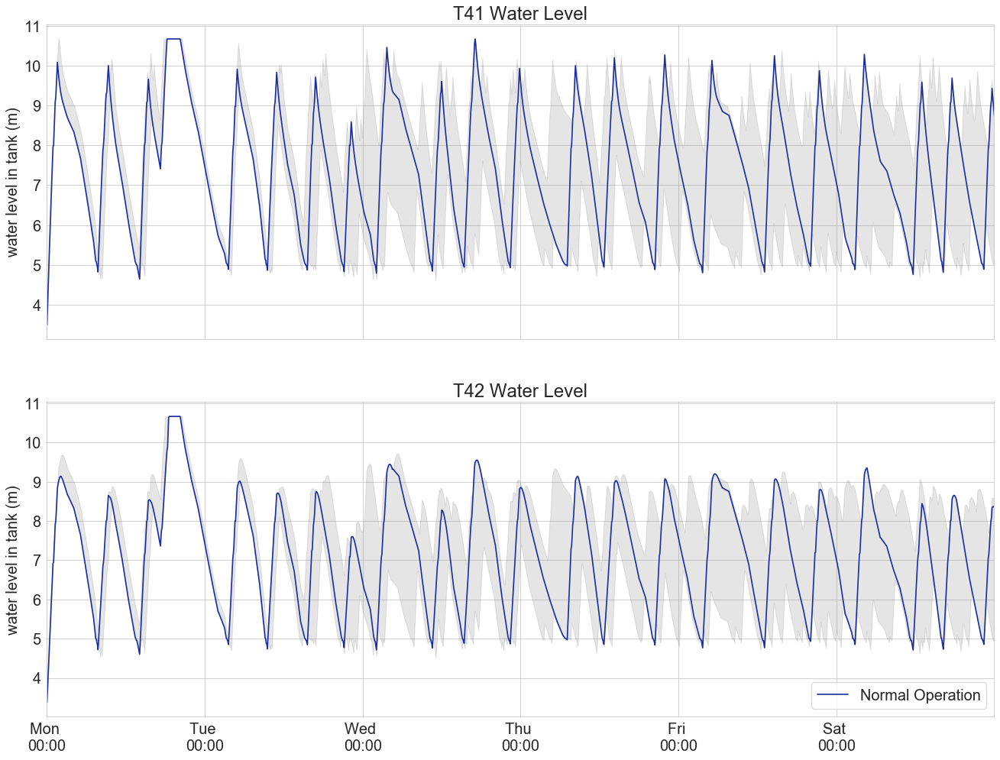

In [18]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([normal_operation_runs_wntr[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [mininum_t41_wntr, mininum_t42_wntr], [maximum_t41_wntr,maximum_t42_wntr],
                   plot_colors, 'envelope_wntr', ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

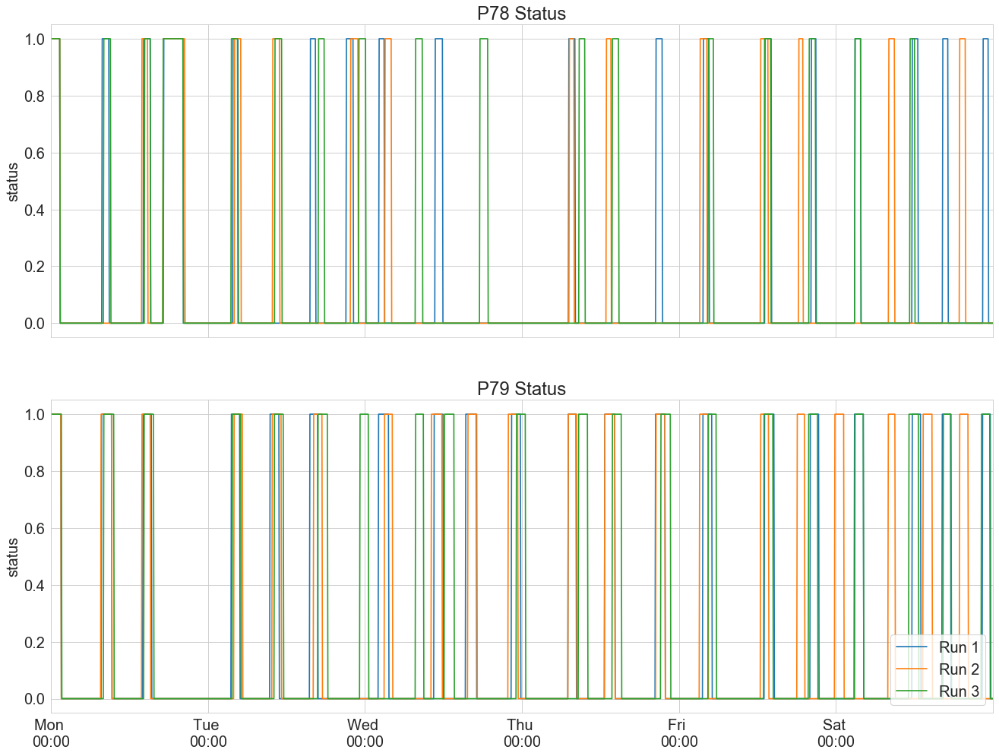

In [19]:
pumps = ['P78_STATUS', 'P79_STATUS']
do_subplot([normal_operation_runs_wntr[0], normal_operation_runs_wntr[1], normal_operation_runs_wntr[2]], pumps,
           ['Run 1', 'Run 2', 'Run 3'],  ['P78 Status', 'P79 Status'], 'wntr_runs_pumps',
           y_label = 'status', xlim = [0,1728])

# Testing Davide's skip step version

In [20]:
anytown_normal_new_skip = pd.read_csv('normal_operation_new_skip_version/run_0/output/ground_truth.csv')
dos_attack_plc1_new_skip = pd.read_csv('dos_test_plc1_new_skip/output/ground_truth.csv')

mitm_attack_plc1_new_skip = pd.read_csv('mittm_test_plc1_new_skip/output/ground_truth.csv')
nwk_event_new_skip = pd.read_csv('nwk_event_new_skip/output/ground_truth.csv')

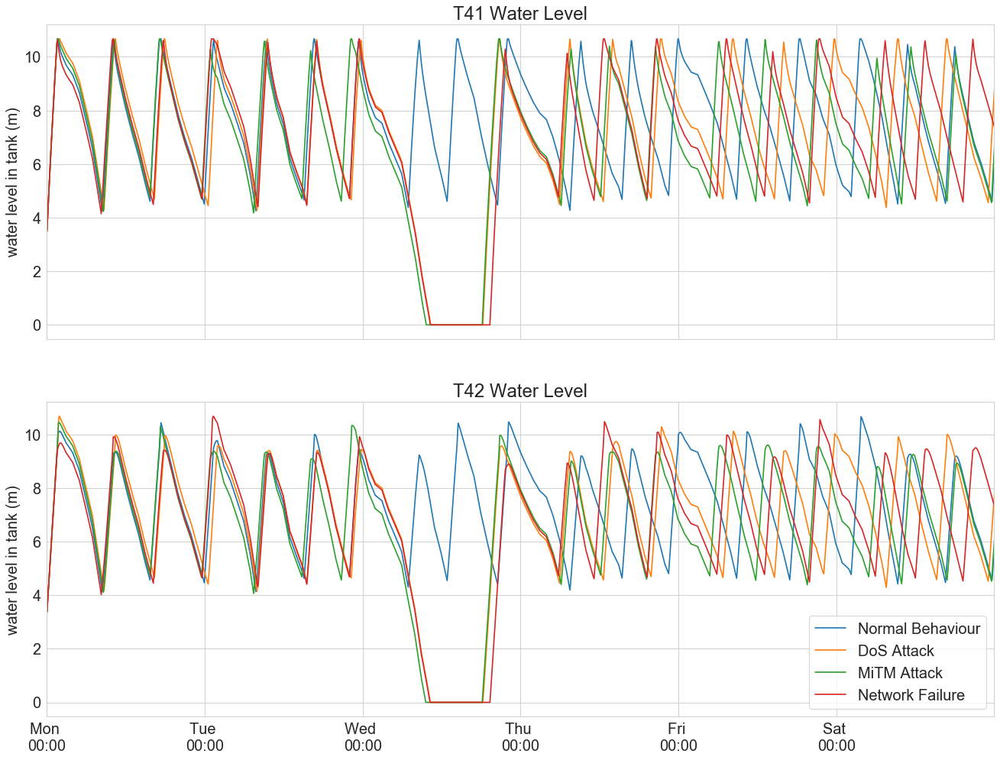

In [21]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([anytown_normal_new_skip, dos_attack_plc1_new_skip, mitm_attack_plc1_new_skip, nwk_event_new_skip], tanks,
           ['Normal Behaviour', 'DoS Attack', 'MiTM Attack', 'Network Failure'], titles = ['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'anomalies_tank_levels_new_skip', y_label='water level in tank (m)', xlim=[0,1728])

In [22]:
folder_prefix = 'normal_operation_new_skip_version/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

normal_operation_new_skip_runs = []
for file in paths:     
    normal_operation_new_skip_runs.append(pd.read_csv(file + '/output/ground_truth.csv'))

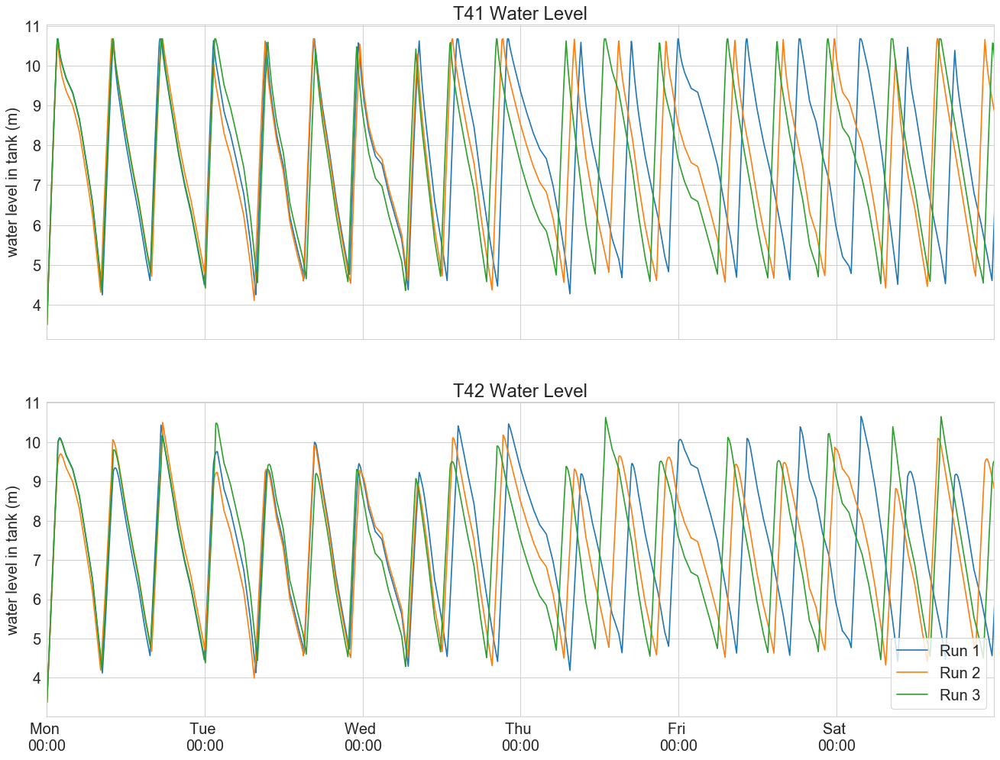

In [23]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([normal_operation_new_skip_runs[0], normal_operation_new_skip_runs[1], normal_operation_new_skip_runs[2]], tanks, 
           ['Run 1', 'Run 2', 'Run 3'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'normal_operation_conditions_runs_new_skip', y_label='water level in tank (m)', xlim=[0,1728])

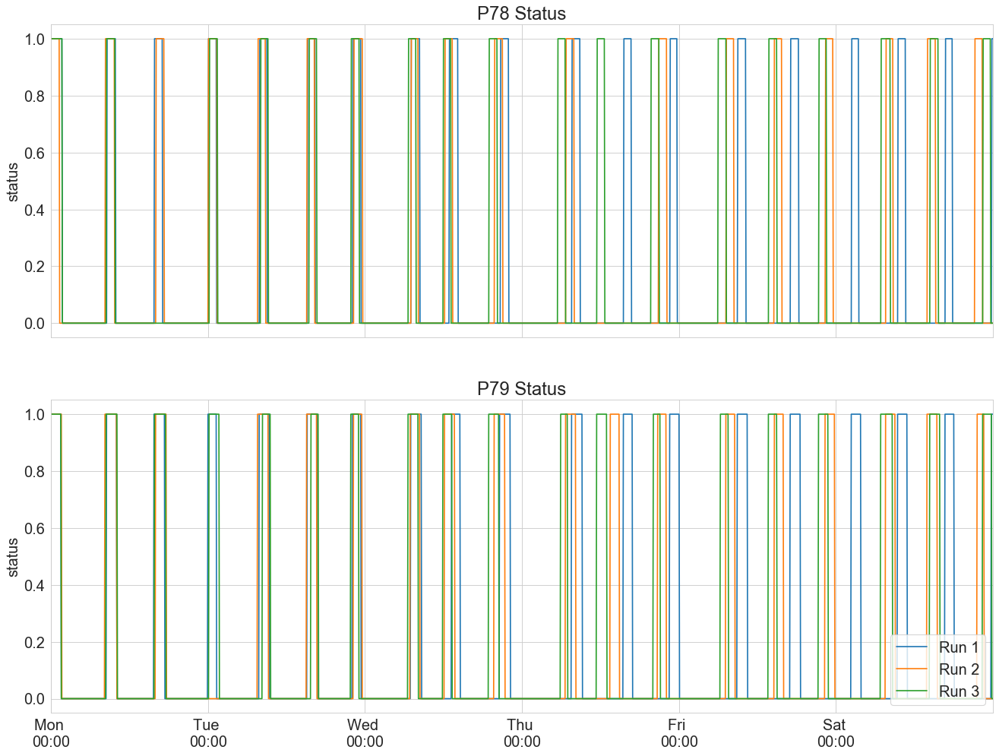

In [24]:
pumps = ['P78_STATUS', 'P79_STATUS']
do_subplot([normal_operation_new_skip_runs[0], normal_operation_new_skip_runs[1], normal_operation_new_skip_runs[2]], pumps, 
           ['Run 1', 'Run 2', 'Run 3'], titles=['P78 Status', 'P79 Status'],
           sub_filename = 'normal_operation_conditions_runs_new_skip_pumps', y_label='status', xlim=[0,1728])

In [25]:
# We are in a rush, later find an elegant solution
normal_new_skip_t41 = pd.concat([pd.Series(normal_operation_new_skip_runs[0]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[1]['T41_LEVEL'][0:1997].values),                          
                        pd.Series(normal_operation_new_skip_runs[2]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[3]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[4]['T41_LEVEL'][0:1997].values)], axis=1)

# We are in a rush, later find an elegant solution
normal_new_skip_t42 = pd.concat([pd.Series(normal_operation_new_skip_runs[0]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[1]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[2]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[3]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_runs[4]['T42_LEVEL'][0:1997].values)], axis=1)

In [26]:
maximum_new_skip_t41 = normal_new_skip_t41.max(axis=1)
mininum_new_skip_t41 = normal_new_skip_t41.min(axis=1)

maximum_new_skip_t42 = normal_new_skip_t42.max(axis=1)
mininum_new_skip_t42 = normal_new_skip_t42.min(axis=1)

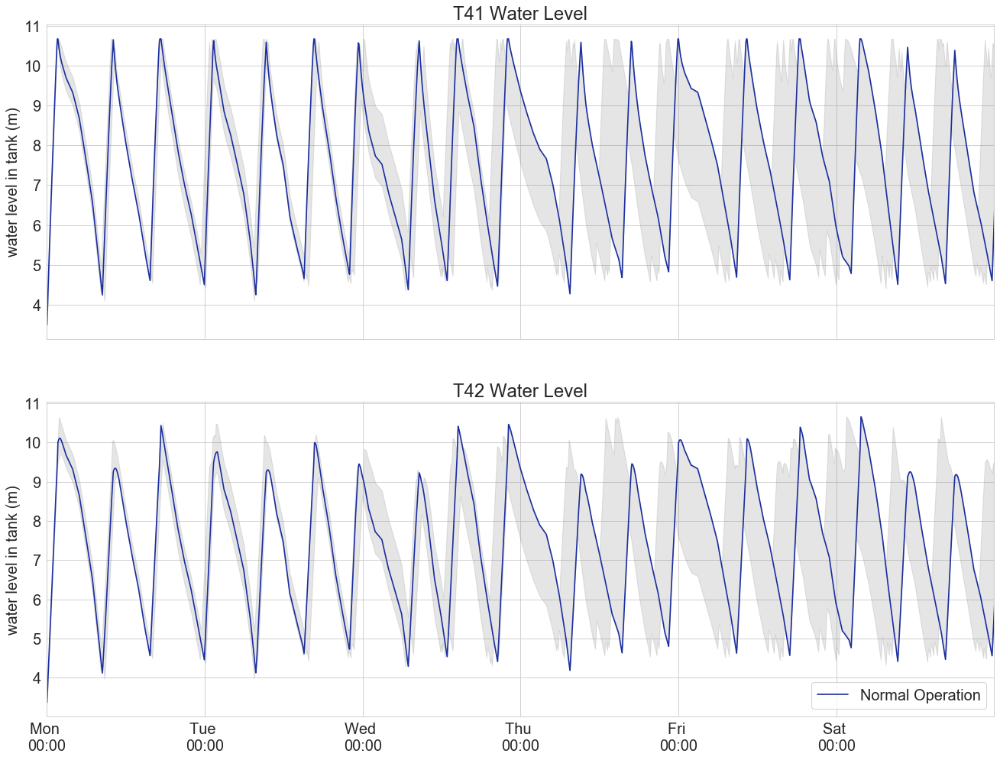

In [27]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([normal_operation_new_skip_runs[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], [mininum_new_skip_t41, mininum_new_skip_t42], 
                   [maximum_new_skip_t41, maximum_new_skip_t42],
                   plot_colors, 'envelope_new_skip', ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

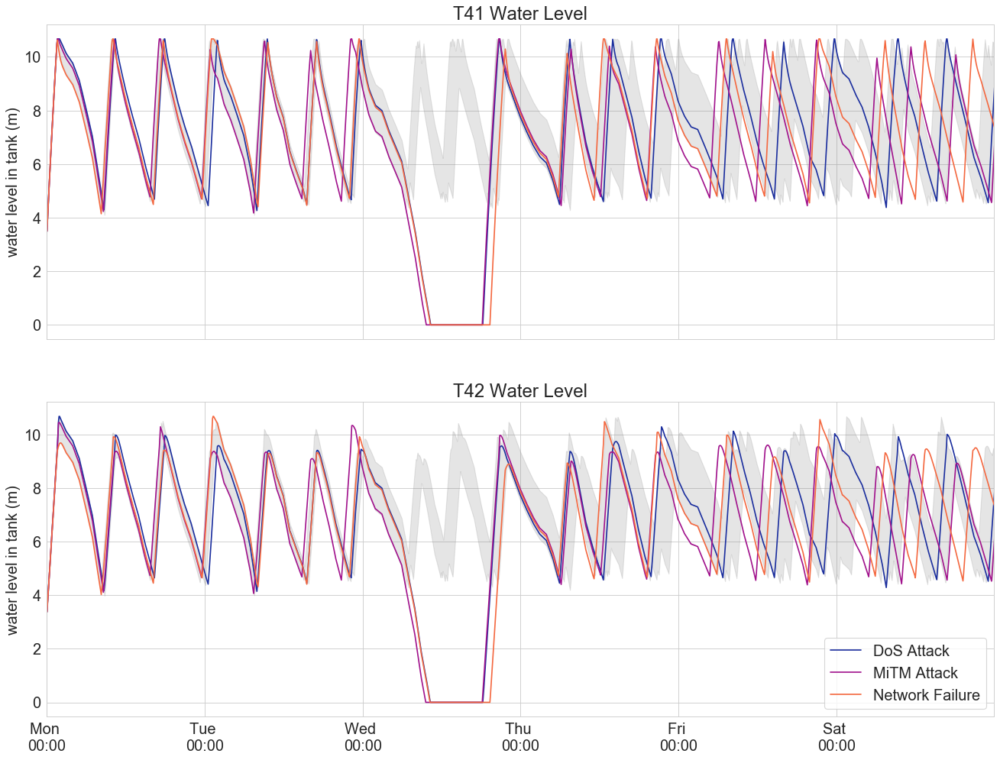

In [28]:
plot_colors = ['#1b2e9e', '#a1128c', '#f46840' ]
series = [dos_attack_plc1_new_skip, mitm_attack_plc1_new_skip, nwk_event_new_skip] 
file_name = 'envelope_with_attacks_new_skip'
title = ['T41 Level', 'T42 Level']
plot_with_envelope(series, ['T41_LEVEL', 'T42_LEVEL'], ['DoS Attack', 'MiTM Attack', 'Network Failure'], [mininum_new_skip_t41, mininum_new_skip_t42], [maximum_new_skip_t41, maximum_new_skip_t42], 
                    plot_colors, file_name, ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

# Testing Davide's Skip and updating actuators always

In [29]:
anytown_normal_new_skip_update_always = pd.read_csv('normal_operation_new_skip_version_update_always/run_0/output/ground_truth.csv')
dos_attack_plc1_new_skip_update_always = pd.read_csv('dos_test_plc1_new_skip_update_always/output/ground_truth.csv')
mitm_attack_plc1_new_skip_update_always = pd.read_csv('mitm_test_plc1_new_skip_update_always/output/ground_truth.csv')
nwk_event_new_skip_update_always = pd.read_csv('nwk_event_new_skip_update_always/output/ground_truth.csv')

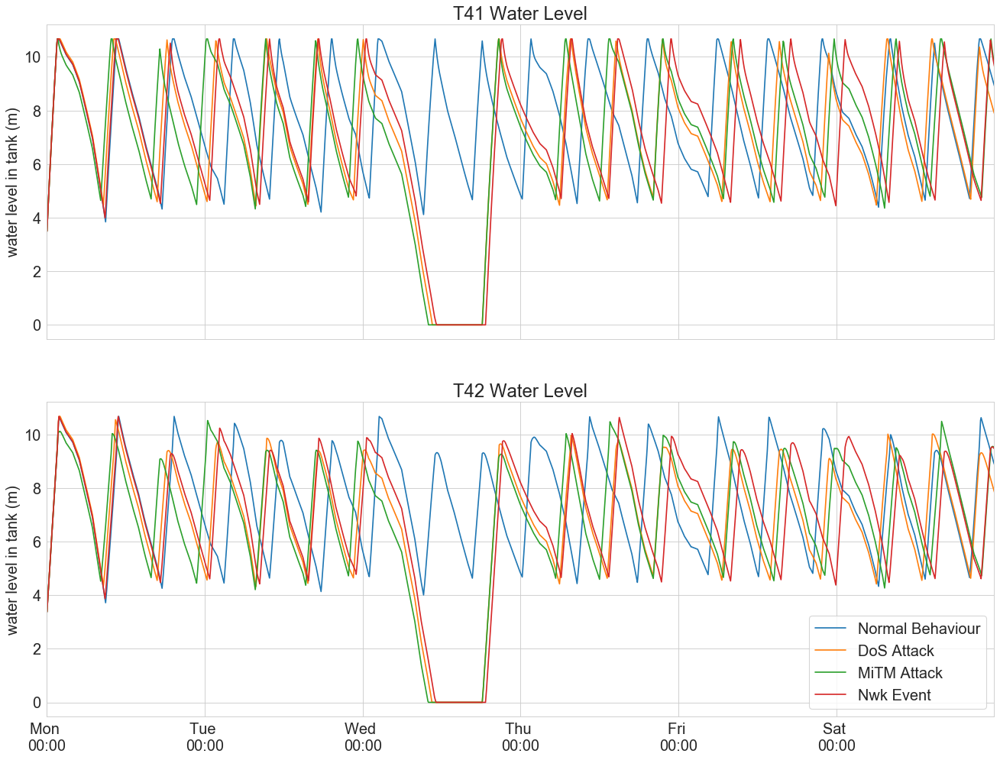

In [30]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([anytown_normal_new_skip_update_always, dos_attack_plc1_new_skip_update_always, 
            mitm_attack_plc1_new_skip_update_always, nwk_event_new_skip_update_always], tanks,
           ['Normal Behaviour', 'DoS Attack', 'MiTM Attack', 'Nwk Event'], 
           titles=['T41 Water Level', 'T42 Water Level'],sub_filename = 'anomalies_tank_levels_new_skip_always_update', 
           y_label = 'water level in tank (m)',xlim=[0,1728])

In [31]:
folder_prefix = 'normal_operation_new_skip_version_update_always/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

normal_operation_new_skip_update_always_runs = []
for file in paths:     
    normal_operation_new_skip_update_always_runs.append(pd.read_csv(file + '/output/ground_truth.csv'))

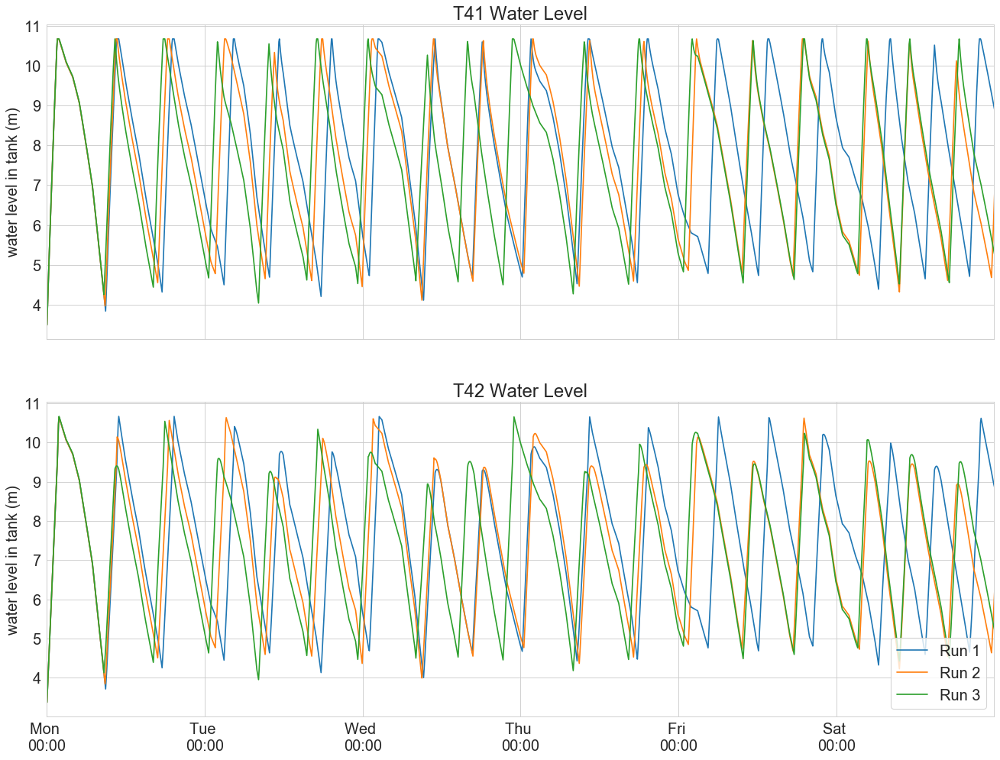

In [32]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([normal_operation_new_skip_update_always_runs[0], normal_operation_new_skip_update_always_runs[1], 
            normal_operation_new_skip_update_always_runs[2]], tanks, 
           ['Run 1', 'Run 2', 'Run 3'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'normal_operation_conditions_runs_new_skip_always_update', y_label='water level in tank (m)',
           xlim = [0,1728])

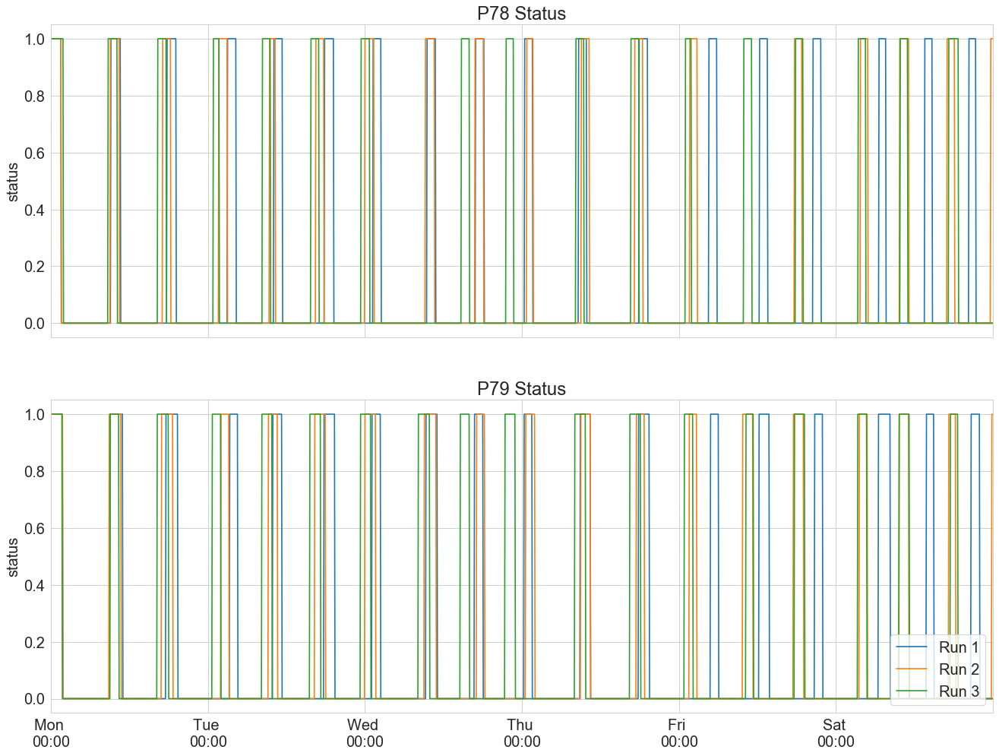

In [33]:
pumps = ['P78_STATUS', 'P79_STATUS']
do_subplot([normal_operation_new_skip_update_always_runs[0], normal_operation_new_skip_update_always_runs[1], 
            normal_operation_new_skip_update_always_runs[2]], pumps, 
           ['Run 1', 'Run 2', 'Run 3'], titles=['P78 Status', 'P79 Status'],
           sub_filename = 'normal_operation_conditions_runs_new_skip_always_updates_pumps', y_label='status',
           xlim = [0,1728])

In [34]:
# We are in a rush, later find an elegant solution
normal_new_skip_update_always_t41 = pd.concat([pd.Series(normal_operation_new_skip_update_always_runs[0]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[1]['T41_LEVEL'][0:1997].values),                          
                        pd.Series(normal_operation_new_skip_update_always_runs[2]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[3]['T41_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[4]['T41_LEVEL'][0:1997].values)], axis=1)

# We are in a rush, later find an elegant solution
normal_new_skip_update_always_t42 = pd.concat([pd.Series(normal_operation_new_skip_update_always_runs[0]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[1]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[2]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[3]['T42_LEVEL'][0:1997].values),
                        pd.Series(normal_operation_new_skip_update_always_runs[4]['T42_LEVEL'][0:1997].values)], axis=1)

In [35]:
maximum_new_skip_update_always_t41 = normal_new_skip_update_always_t41.max(axis=1)
minimum_new_skip_update_always_t41 = normal_new_skip_update_always_t41.min(axis=1)

maximum_new_skip_update_always_t42 = normal_new_skip_update_always_t42.max(axis=1)
minimum_new_skip_update_always_t42 = normal_new_skip_update_always_t42.min(axis=1)

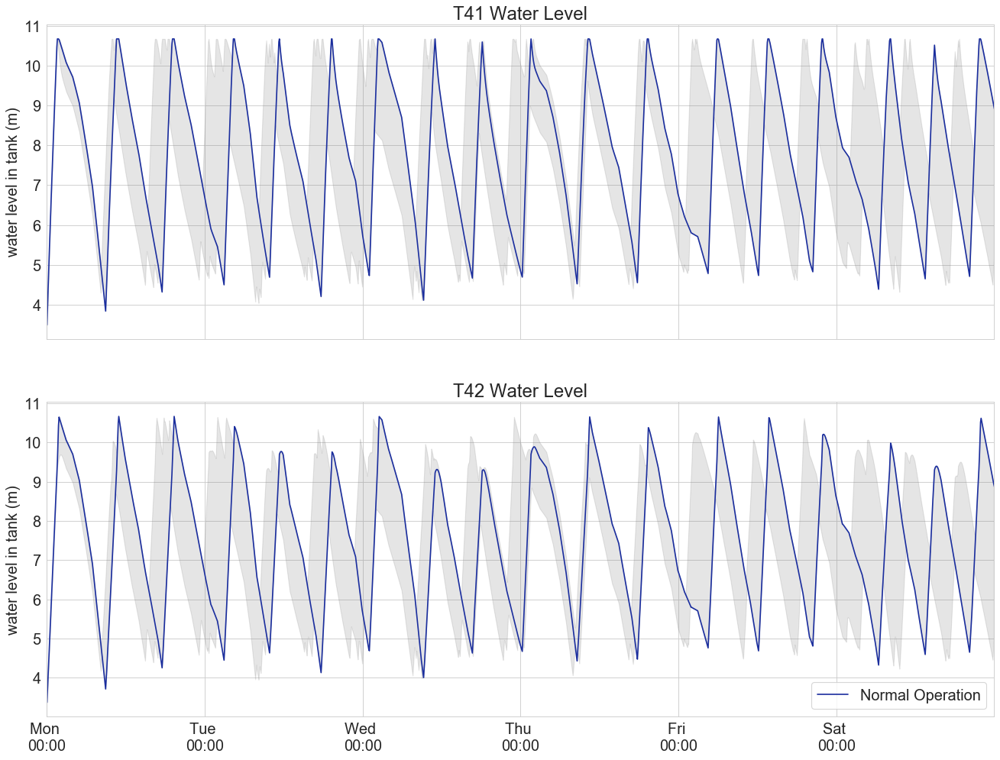

In [36]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([normal_operation_new_skip_update_always_runs[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], [minimum_new_skip_update_always_t41, minimum_new_skip_update_always_t42], 
                   [maximum_new_skip_update_always_t41, maximum_new_skip_update_always_t42], plot_colors, 'envelope_new_skip__always_update', ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

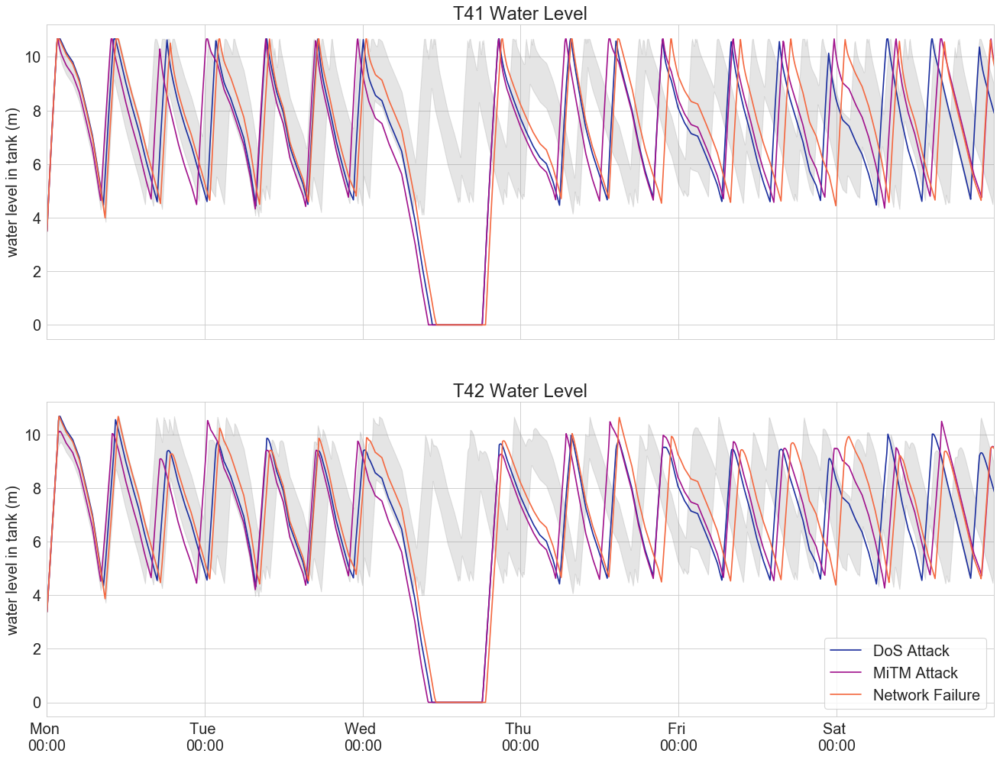

In [37]:
plot_colors = ['#1b2e9e', '#a1128c', '#f46840' ]
series = [dos_attack_plc1_new_skip_update_always, mitm_attack_plc1_new_skip_update_always, nwk_event_new_skip_update_always] 
file_name = 'envelope_with_attacks_new_skip_always_update'
title = ['T41 Level', 'T42 Level']
plot_with_envelope(series, ['T41_LEVEL', 'T42_LEVEL'], ['DoS Attack', 'MiTM Attack', 'Network Failure'], [minimum_new_skip_update_always_t41, minimum_new_skip_update_always_t42],
                   [maximum_new_skip_update_always_t41, maximum_new_skip_update_always_t42], plot_colors, file_name, 
                   ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

# CDF plots for pump activation using different skip methods

In [38]:
def get_change_cdf(pd, tag):      
    changes = pd[tag] != pd[tag].shift(1)
    return changes

In [39]:
def generate_change_curve(pd, tag):    
    change_series = get_change_cdf(pd, tag)
    curve = []
    activation_count = 0
    for value in change_series:
        if value:
            activation_count = activation_count + 1            
            curve.append(activation_count)
        else:
            curve.append(activation_count)            
    return curve

In [40]:
def plot_curves_cdf(change_curves, legends, title, cdf_file_name, xlim=None):
    sns.set_style("whitegrid")
        
    ticks = np.arange(0, 1728, step=288)
    ticks_labels = ['Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00']
    
    
    fig = plt.figure(figsize = (20,15), dpi=80)
    
    i = 0    
    for variable in change_curves:
        plt.plot(variable, label=legends[i])
        plt.legend()
        plt.grid(True)        
        plt.title(title)
        plt.ylabel('Number of Activations')             
        plt.xticks(ticks, ticks_labels)
        plt.xlim(left=xlim[0], right=xlim[1])      
        plt.ylim(bottom=0, top=40)   
        i = i +1
        
    
    plt.savefig(cdf_file_name+'.png', orientation='landscape')
    plt.savefig(cdf_file_name+'.pdf', orientation='landscape')
        
    font = {'family' : 'normal',
            'weight' : 'normal',
            'size'   : 18}

    plt.rc('font', **font)    

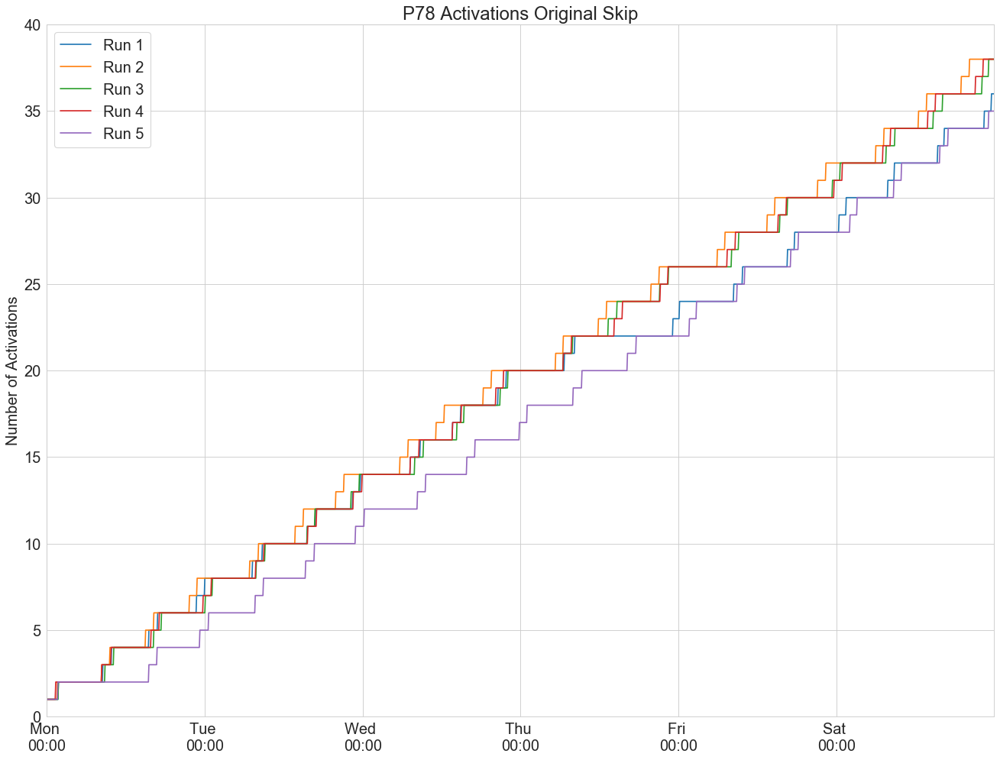

In [41]:
change_curves = []    
for i in range(0,5):
    change_curves.append(generate_change_curve(normal_operation_runs[i], 'P78_STATUS'))        
plot_curves_cdf(change_curves, 
                ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], 'P78 Activations Original Skip',
               'p78_activations_old_skip', [0,1728])

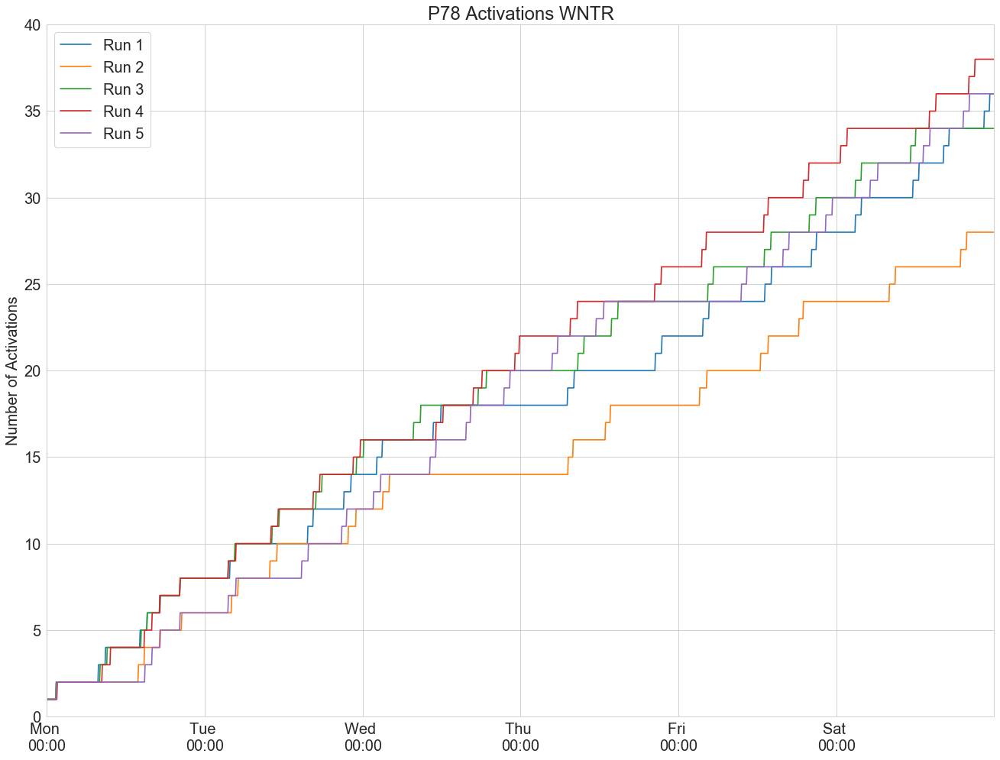

In [42]:
change_curves = []    
for i in range(0,5):
    change_curves.append(generate_change_curve(normal_operation_runs_wntr[i], 'P78_STATUS'))        
plot_curves_cdf(change_curves, 
                ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], 'P78 Activations WNTR',
               'p78_activations_wntr', [0,1728])

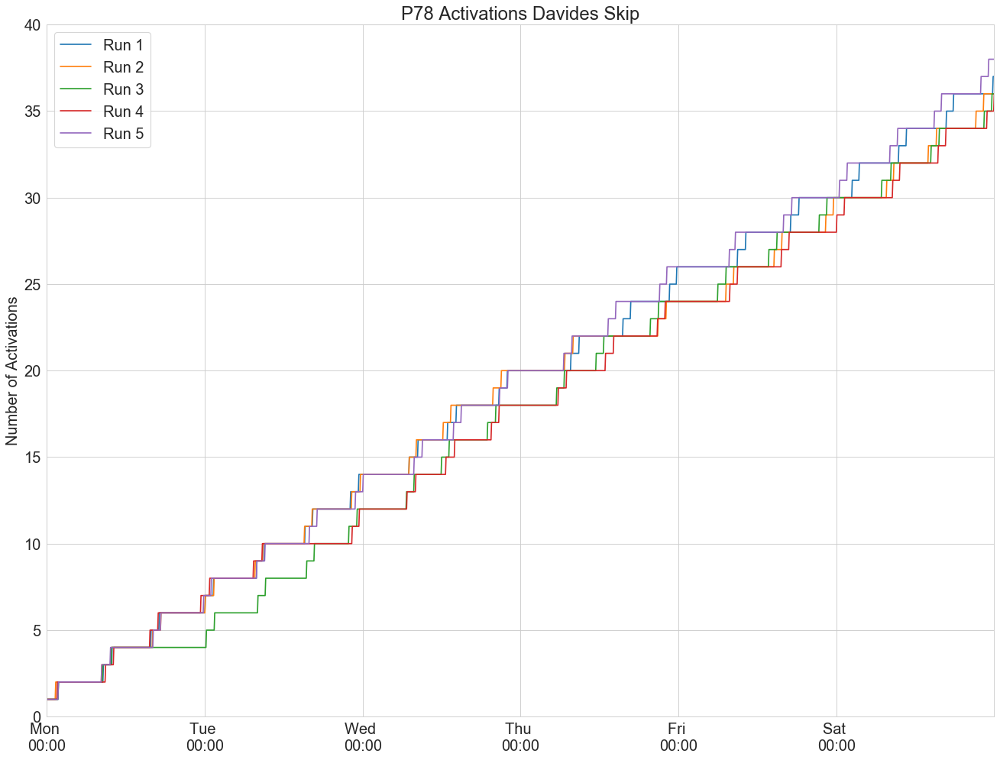

In [43]:
change_curves = []    
for i in range(0,5):
    change_curves.append(generate_change_curve(normal_operation_new_skip_runs[i], 'P78_STATUS'))        
plot_curves_cdf(change_curves, 
                ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], 'P78 Activations Davides Skip',
               'p78_activations_new_skip', [0,1728])

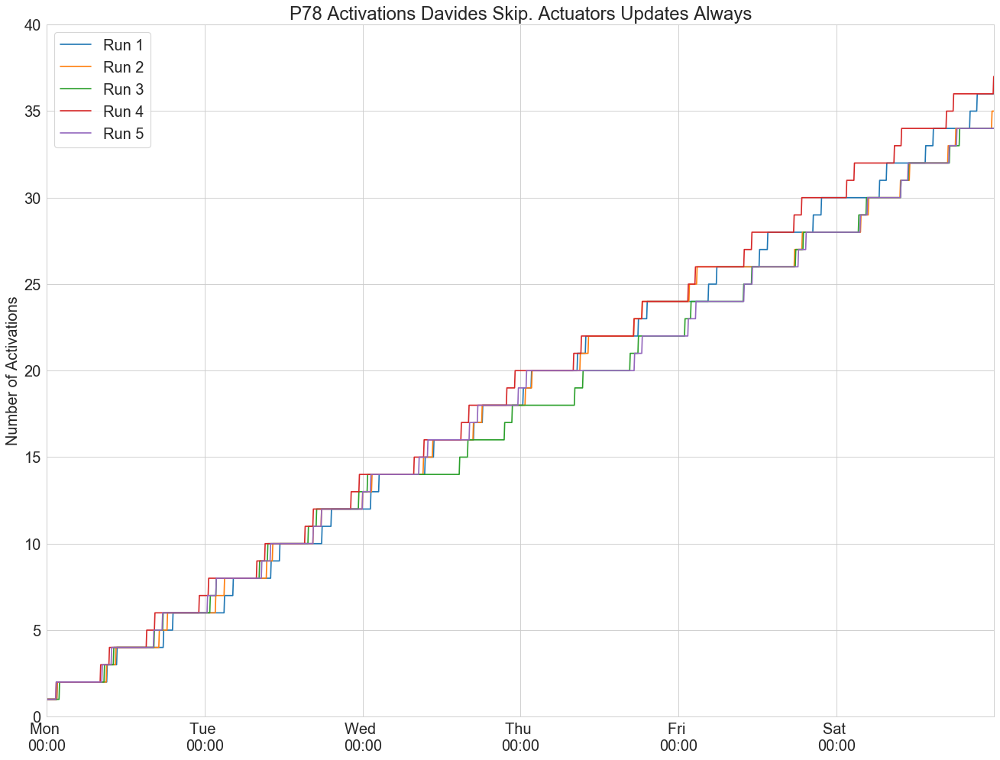

In [44]:
change_curves = []    
for i in range(0,5):
    change_curves.append(generate_change_curve(normal_operation_new_skip_update_always_runs[i], 'P78_STATUS'))        
plot_curves_cdf(change_curves, 
                ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], 'P78 Activations Davides Skip. Actuators Updates Always',
               'p78_activations_new_skip_update_always', [0,1728])

# Long Simulations with New Skip and New Skip/Update Always

In [45]:
folder_prefix = 'long_normal_operations/new_skip_update_actuators_always/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)
normal_long_new_skip_update_always = []
for file in paths:     
    normal_long_new_skip_update_always.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
# We are in a rush, later find an elegant solution
normal_t41_long_new_skip_update_always = pd.concat([pd.Series(normal_long_new_skip_update_always[0]['T41_LEVEL'].values),
                        pd.Series(normal_long_new_skip_update_always[1]['T41_LEVEL'].values),                          
                        pd.Series(normal_long_new_skip_update_always[2]['T41_LEVEL'].values),
                        pd.Series(normal_long_new_skip_update_always[3]['T41_LEVEL'].values),
                        pd.Series(normal_long_new_skip_update_always[4]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
normal_t42_long_new_skip_update_always = pd.concat([pd.Series(normal_long_new_skip_update_always[0]['T42_LEVEL'].values),
                        pd.Series(normal_long_new_skip_update_always[1]['T42_LEVEL'].values),                          
                        pd.Series(normal_long_new_skip_update_always[2]['T42_LEVEL'].values),
                        pd.Series(normal_long_new_skip_update_always[3]['T42_LEVEL'].values),
                        pd.Series(normal_long_new_skip_update_always[4]['T42_LEVEL'].values)],axis=1)

In [46]:
maximum_t41_long_new_skip_update_always = normal_t41_long_new_skip_update_always.max(axis=1)
minimum_t41_long_new_skip_update_always = normal_t41_long_new_skip_update_always.min(axis=1)

maximum_t42_long_new_skip_update_always = normal_t42_long_new_skip_update_always.max(axis=1)
minimum_t42_long_new_skip_update_always = normal_t42_long_new_skip_update_always.min(axis=1)

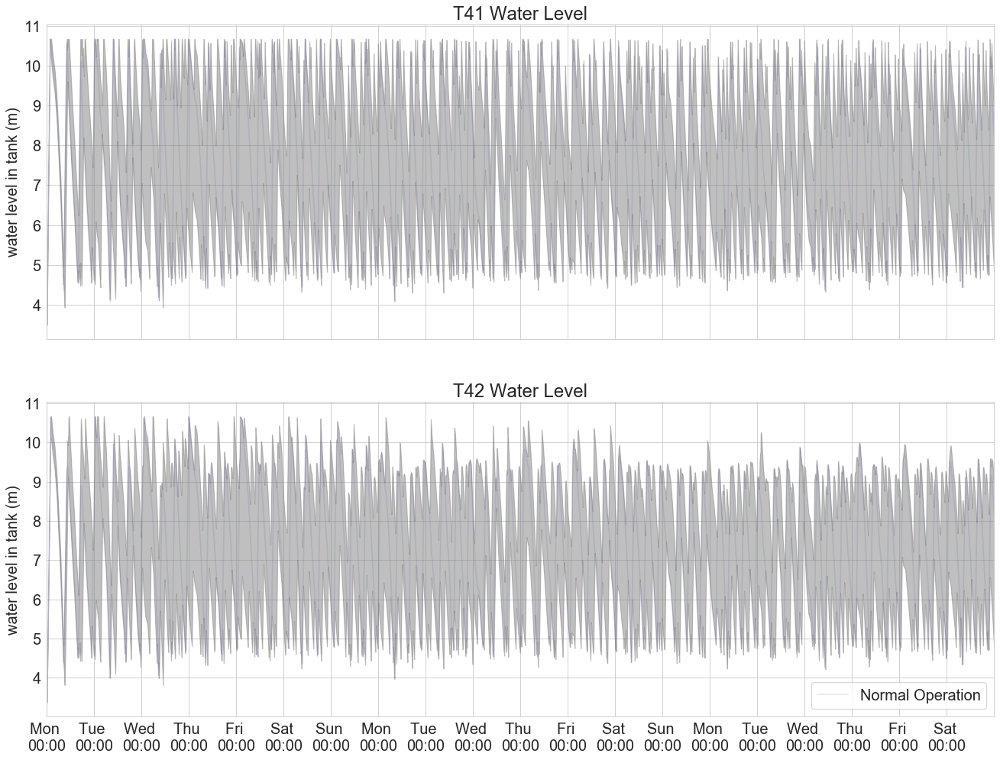

In [47]:
series = [normal_long_new_skip_update_always[0]]
variable_names = ['T41_LEVEL', 'T42_LEVEL']
legends = ['Normal Operation']
envelope_min = [minimum_t41_long_new_skip_update_always,minimum_t42_long_new_skip_update_always]
envelope_max = [maximum_t41_long_new_skip_update_always, maximum_t42_long_new_skip_update_always]
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']       
env_file_name = 'envelope_new_skip_update_always_long'   
titles = ['T41 Water Level', 'T42 Water Level']          
          

sns.set_style("whitegrid")
subplot_n_columns = 1

xlim = [0, 5760]
time =  np.arange(xlim[0], xlim[1])
subplot_n_rows = 2

ticks = np.arange(xlim[0], xlim[1], step=288)
ticks_labels = ['Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00', 'Sun \n00:00', 
                'Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00', 'Sun \n00:00',
                'Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00',]

# Builds subplot grid
f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (20,15), squeeze=False, dpi=80, sharex=True)

# sharex='all', sharey='all'

subplot_row = 0
subplot_column = 0
i = 0    
for variable in variable_names:
    j = 0
    for serie in series:
        axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], color=plot_colors[j], alpha=0.1)
    axes[subplot_row][subplot_column].fill_between(time, envelope_min[i][xlim[0]:xlim[1]], envelope_max[i][xlim[0]:xlim[1]], alpha=0.5, color='gray')

    if i== 1:
        axes[subplot_row][subplot_column].legend(loc='lower right')

    axes[subplot_row][subplot_column].grid(True)
    axes[subplot_row][subplot_column].set_title(titles[i])
    axes[subplot_row][subplot_column].set_ylabel('water level in tank (m)')             

    axes[subplot_row][subplot_column].set_xticks(ticks)
    axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)

    if xlim:
        axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
    subplot_column = subplot_column + 1
    if subplot_column >= subplot_n_columns:
        subplot_column = 0
        subplot_row = subplot_row + 1

    i = i +1

plt.savefig(env_file_name+'.png', orientation='landscape')
plt.savefig(env_file_name+'.pdf', orientation='landscape')

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}
plt.rc('font', **font)

In [48]:
folder_prefix = 'long_normal_operations/new_skip/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)
normal_long_new_skip = []
for file in paths:     
    normal_long_new_skip.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
# We are in a rush, later find an elegant solution
normal_t41_long_new_skip = pd.concat([pd.Series(normal_long_new_skip[0]['T41_LEVEL'].values),
                        pd.Series(normal_long_new_skip[1]['T41_LEVEL'].values),                          
                        pd.Series(normal_long_new_skip[2]['T41_LEVEL'].values),
                        pd.Series(normal_long_new_skip[3]['T41_LEVEL'].values),
                        pd.Series(normal_long_new_skip[4]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
normal_t42_long_new_skip = pd.concat([pd.Series(normal_long_new_skip[0]['T42_LEVEL'].values),
                        pd.Series(normal_long_new_skip[1]['T42_LEVEL'].values),                          
                        pd.Series(normal_long_new_skip[2]['T42_LEVEL'].values),
                        pd.Series(normal_long_new_skip[3]['T42_LEVEL'].values),
                        pd.Series(normal_long_new_skip[4]['T42_LEVEL'].values)],axis=1)

In [49]:
maximum_t41_long_new_skip = normal_t41_long_new_skip.max(axis=1)
minimum_t41_long_new_skip = normal_t41_long_new_skip.min(axis=1)

maximum_t42_long_new_skip = normal_t42_long_new_skip.max(axis=1)
minimum_t42_long_new_skip = normal_t42_long_new_skip.min(axis=1)

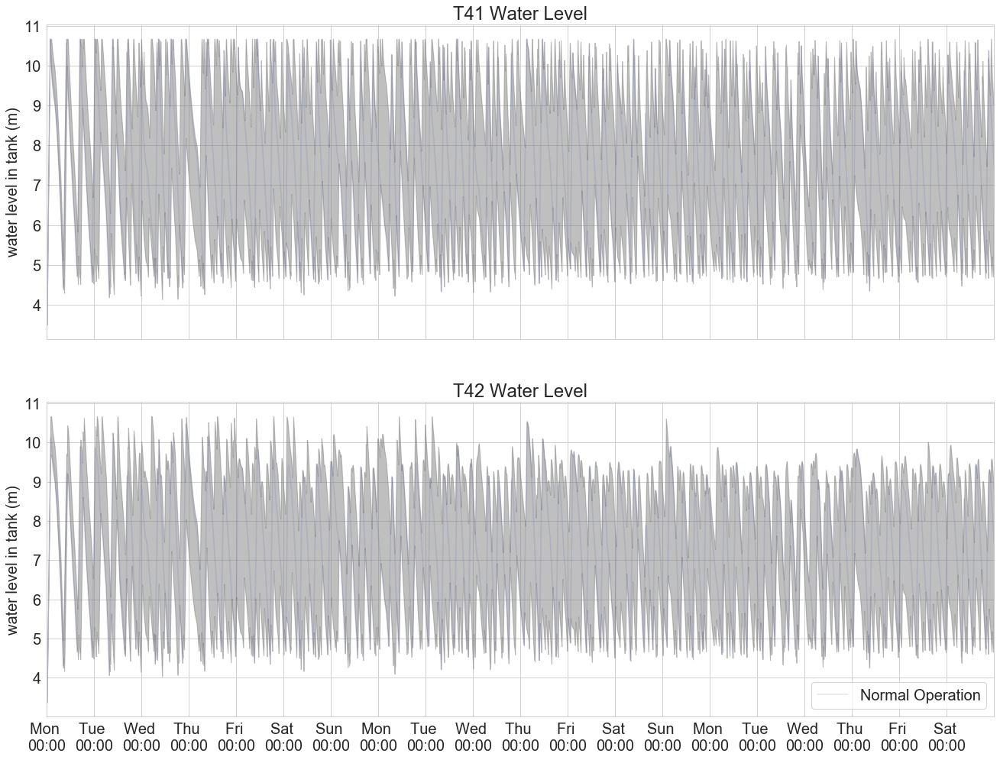

In [50]:
series = [normal_long_new_skip[0]]
variable_names = ['T41_LEVEL', 'T42_LEVEL']
legends = ['Normal Operation']
envelope_min = [minimum_t41_long_new_skip,minimum_t42_long_new_skip]
envelope_max = [maximum_t41_long_new_skip, maximum_t42_long_new_skip]
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']       
env_file_name = 'envelope_new_skip'   
titles = ['T41 Water Level', 'T42 Water Level']          
          

sns.set_style("whitegrid")
subplot_n_columns = 1

xlim = [0, 5760]
time =  np.arange(xlim[0], xlim[1])
subplot_n_rows = 2

ticks = np.arange(xlim[0], xlim[1], step=288)
ticks_labels = ['Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00', 'Sun \n00:00', 
                'Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00', 'Sun \n00:00',
                'Mon \n00:00', 'Tue \n00:00', 'Wed \n00:00', 'Thu \n00:00', 'Fri \n00:00', 'Sat \n00:00',]

# Builds subplot grid
f, axes = plt.subplots(subplot_n_rows,subplot_n_columns, figsize = (20,15), squeeze=False, dpi=80, sharex=True)

# sharex='all', sharey='all'

subplot_row = 0
subplot_column = 0
i = 0    
for variable in variable_names:
    j = 0
    for serie in series:
        axes[subplot_row][subplot_column].plot(serie[variable], label=legends[j], color=plot_colors[j], alpha=0.1)
    axes[subplot_row][subplot_column].fill_between(time, envelope_min[i][xlim[0]:xlim[1]], envelope_max[i][xlim[0]:xlim[1]], alpha=0.5, color='gray')

    if i== 1:
        axes[subplot_row][subplot_column].legend(loc='lower right')

    axes[subplot_row][subplot_column].grid(True)
    axes[subplot_row][subplot_column].set_title(titles[i])
    axes[subplot_row][subplot_column].set_ylabel('water level in tank (m)')             

    axes[subplot_row][subplot_column].set_xticks(ticks)
    axes[subplot_row][subplot_column].set_xticklabels(ticks_labels)

    if xlim:
        axes[subplot_row][subplot_column].set_xlim(left=xlim[0], right=xlim[1])                            
    subplot_column = subplot_column + 1
    if subplot_column >= subplot_n_columns:
        subplot_column = 0
        subplot_row = subplot_row + 1

    i = i +1

plt.savefig(env_file_name+'.png', orientation='landscape')
plt.savefig(env_file_name+'.pdf', orientation='landscape')

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}
plt.rc('font', **font)

In [51]:
scada_test = pd.read_csv('mitm_test_plc1_new_skip_update_always/output/scada_values.csv')
scada_normal = pd.read_csv('normal_operation_new_skip_version_update_always/run_0/output/scada_values.csv')

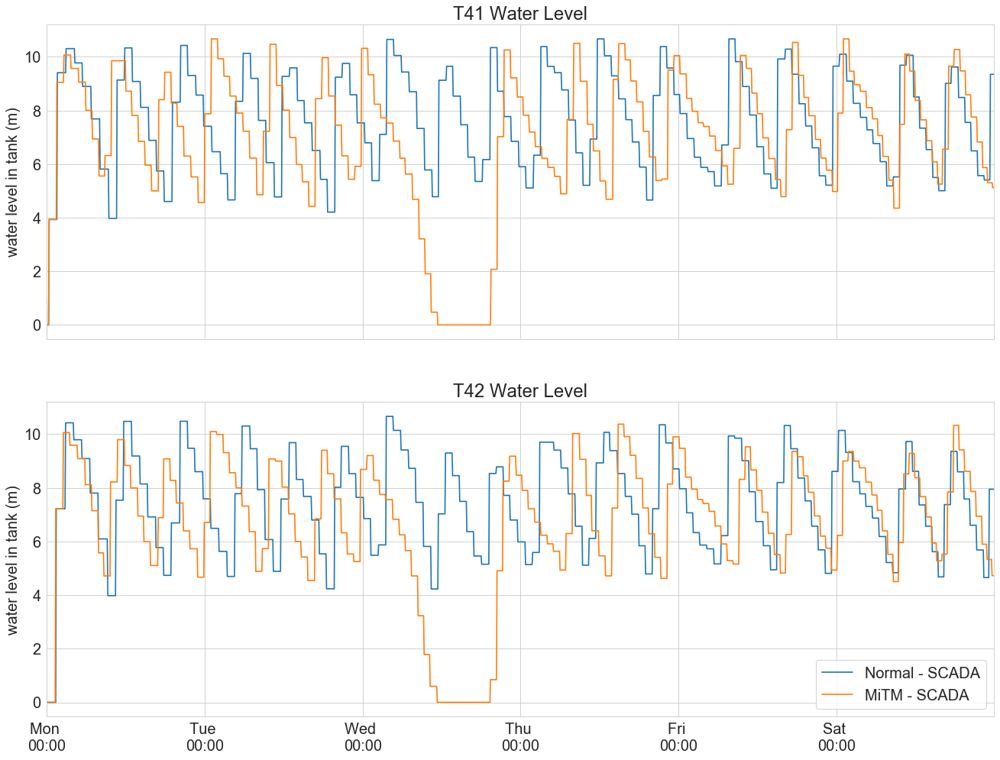

In [52]:
#tanks = ['T41_LEVEL', 'T42_LEVEL']
tanks = ['T41', 'T42']
do_subplot([scada_normal, scada_test], tanks, ['Normal - SCADA', 'MiTM - SCADA'],
           titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'scada_test', y_label='water level in tank (m)', xlim = [0,1728])

# New Skip/Update Always - Using the same seed for all DB_SLEEP_TIME (42)

In [53]:
folder_prefix = 'normal_operation_update_always_seed/random_seed_42/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

normal_update_always_fixed_seed = []
for file in paths:     
    normal_update_always_fixed_seed.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
t41_fixed_seed = pd.concat([pd.Series(normal_update_always_fixed_seed[0]['T41_LEVEL'].values),
                        pd.Series(normal_update_always_fixed_seed[1]['T41_LEVEL'].values),                          
                        pd.Series(normal_update_always_fixed_seed[2]['T41_LEVEL'].values),
                        pd.Series(normal_update_always_fixed_seed[3]['T41_LEVEL'].values),
                        pd.Series(normal_update_always_fixed_seed[4]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
t42_fixed_seed = pd.concat([pd.Series(normal_update_always_fixed_seed[0]['T42_LEVEL'].values),
                        pd.Series(normal_update_always_fixed_seed[1]['T42_LEVEL'].values),                          
                        pd.Series(normal_update_always_fixed_seed[2]['T42_LEVEL'].values),
                        pd.Series(normal_update_always_fixed_seed[3]['T42_LEVEL'].values),
                        pd.Series(normal_update_always_fixed_seed[4]['T42_LEVEL'].values)],axis=1)

In [54]:
maximum_t41_fixed_seed = t41_fixed_seed.max(axis=1)
minimum_t41_fixed_seed = t41_fixed_seed.min(axis=1)

maximum_t42_fixed_seed = t42_fixed_seed.max(axis=1)
minimum_t42_fixed_seed = t42_fixed_seed.min(axis=1)

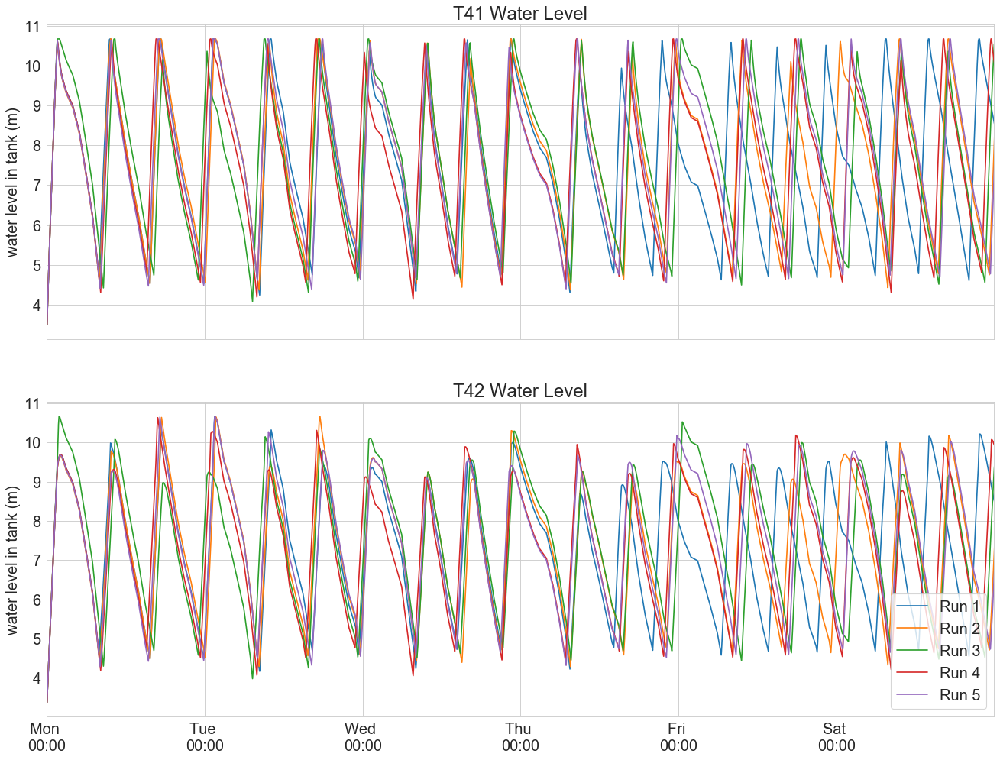

In [55]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([normal_update_always_fixed_seed[0], normal_update_always_fixed_seed[1],normal_update_always_fixed_seed[2],
            normal_update_always_fixed_seed[3], normal_update_always_fixed_seed[4]], tanks,
           ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'fixed_random_seed', y_label='water level in tank (m)')

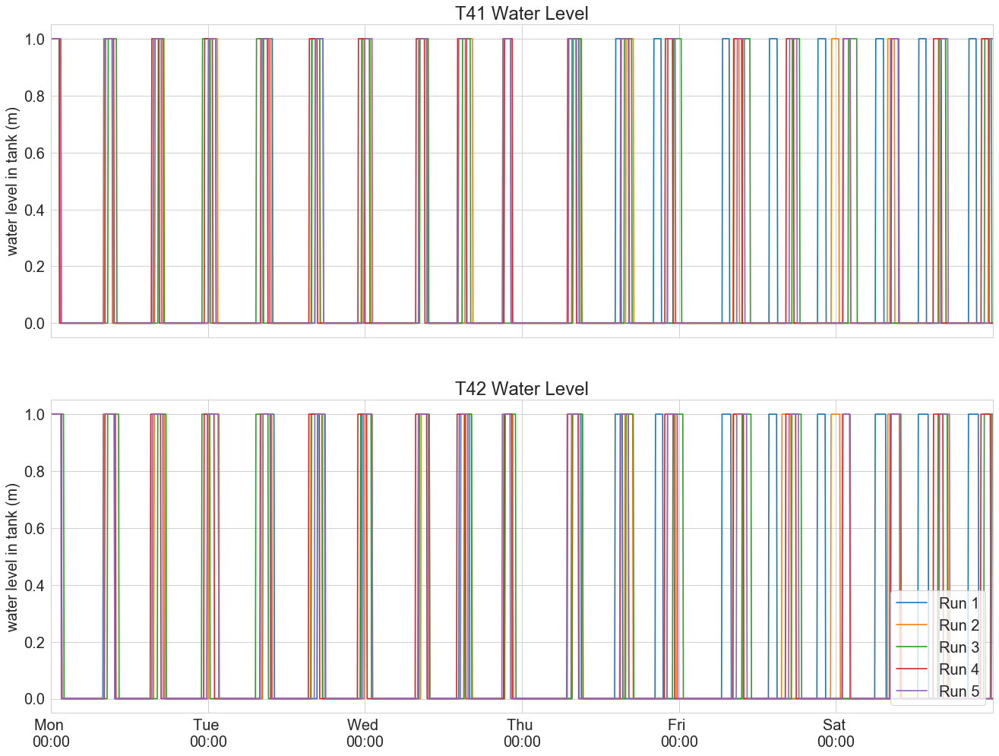

In [56]:
pumps = ['P78_STATUS', 'P79_STATUS']
do_subplot([normal_update_always_fixed_seed[0], normal_update_always_fixed_seed[1],normal_update_always_fixed_seed[2],
            normal_update_always_fixed_seed[3], normal_update_always_fixed_seed[4]], pumps,
           ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'fixed_random_seed', y_label='water level in tank (m)')

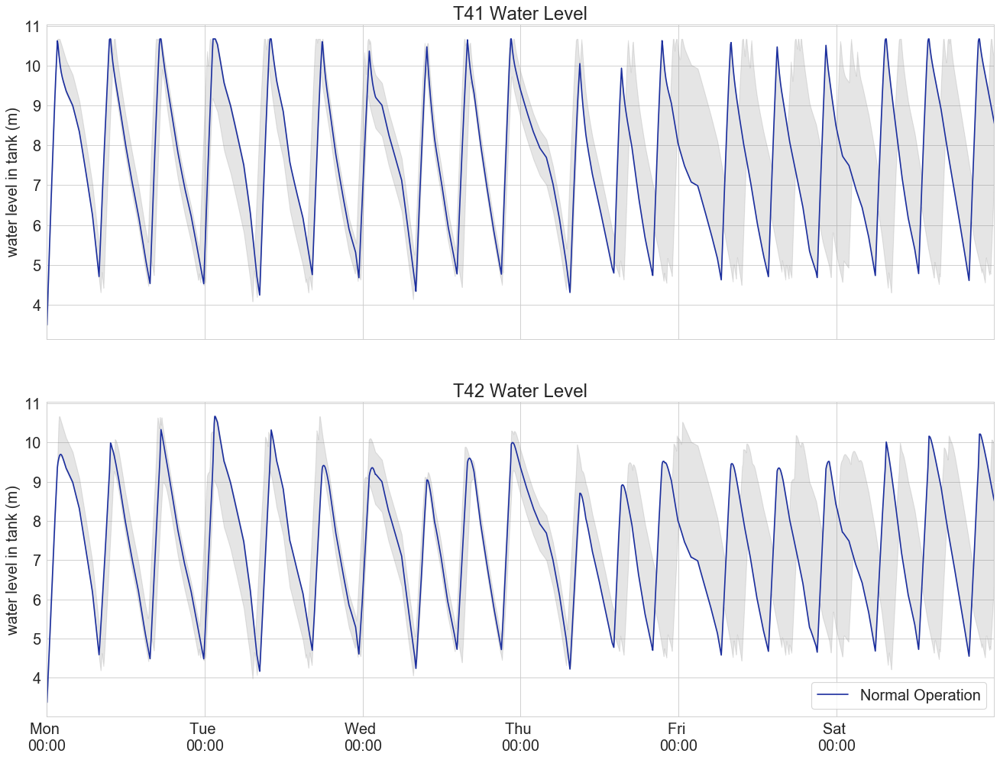

In [57]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([normal_update_always_fixed_seed[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [minimum_t41_fixed_seed, minimum_t42_fixed_seed], 
                   [maximum_t41_fixed_seed, maximum_t42_fixed_seed], plot_colors, 'envelope_fixed_seed', ['T41 Water Level', 'T42 Water Level'], [0,1728], linestyles=None, markers=None)

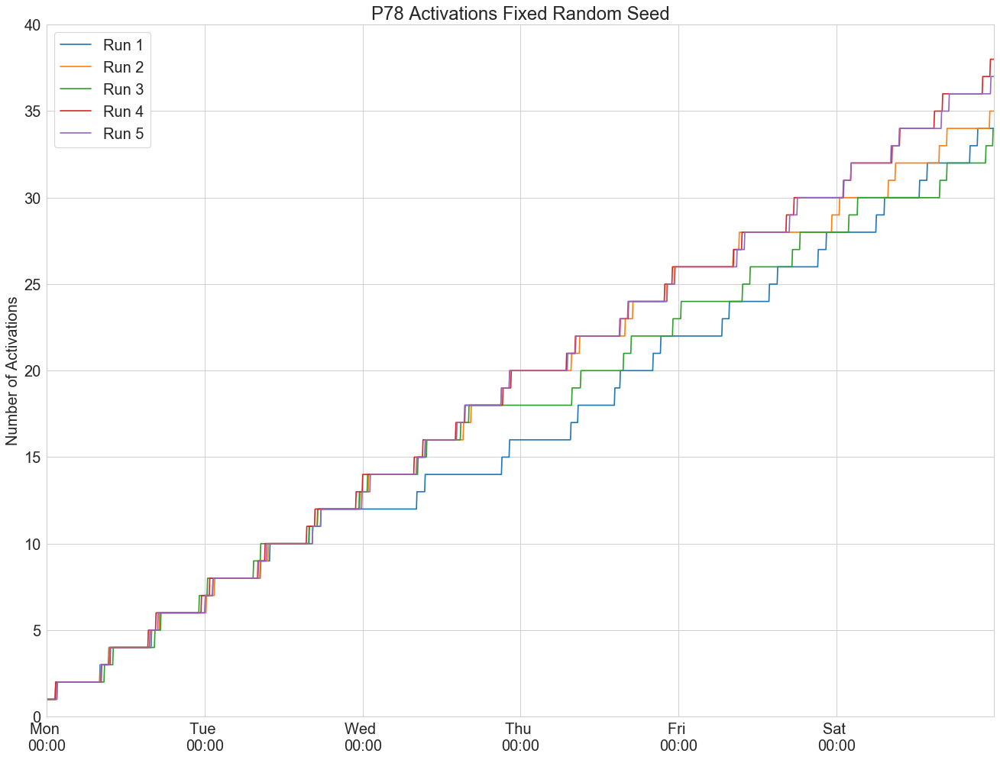

In [58]:
change_curves = []    
for i in range(0,5):
    change_curves.append(generate_change_curve(normal_update_always_fixed_seed[i], 'P78_STATUS'))        
plot_curves_cdf(change_curves, 
                ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], 'P78 Activations Fixed Random Seed',
               'p78_activations_fixed_seed', [0,1728])

# WNTR Standalone envelop of variability

In [61]:
#anytown_normal_new_skip_update_always = pd.read_csv('normal_operation_new_skip_version_update_always/run_0/output/ground_truth.csv')
wntr_standalone = pd.read_csv('WNTR_alone/output/anytown_wntr_standalone_run_0.csv')

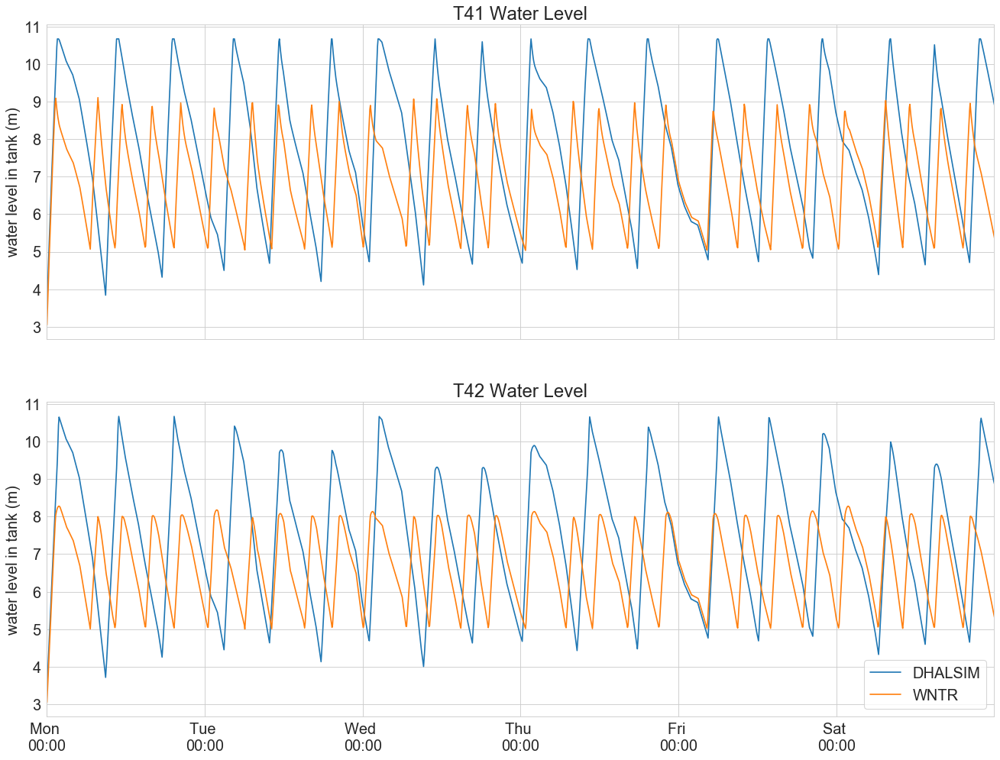

In [62]:
do_subplot([anytown_normal_new_skip_update_always, wntr_standalone], tanks,
           ['DHALSIM', 'WNTR'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'dhalsim_wntr', y_label='water level in tank (m)')

In [63]:
folder_prefix = 'WNTR_alone/output/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

wntr_stand_alone = []

for file in paths:     
    wntr_stand_alone.append(pd.read_csv(file))
    
t41_wntr = pd.concat([pd.Series(wntr_stand_alone[0]['T41_LEVEL'].values),
                        pd.Series(wntr_stand_alone[1]['T41_LEVEL'].values),                          
                        pd.Series(wntr_stand_alone[2]['T41_LEVEL'].values),
                        pd.Series(wntr_stand_alone[3]['T41_LEVEL'].values),
                        pd.Series(wntr_stand_alone[4]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
t42_wntr = pd.concat([pd.Series(wntr_stand_alone[0]['T42_LEVEL'].values),
                        pd.Series(wntr_stand_alone[1]['T42_LEVEL'].values),                          
                        pd.Series(wntr_stand_alone[2]['T42_LEVEL'].values),
                        pd.Series(wntr_stand_alone[3]['T42_LEVEL'].values),
                        pd.Series(wntr_stand_alone[4]['T42_LEVEL'].values)],axis=1)

In [64]:
maximum_t41_wntr = t41_wntr.max(axis=1)
minimum_t41_wntr = t41_wntr.min(axis=1)

maximum_t42_wntr = t42_wntr.max(axis=1)
minimum_t42_wntr = t42_wntr.min(axis=1)

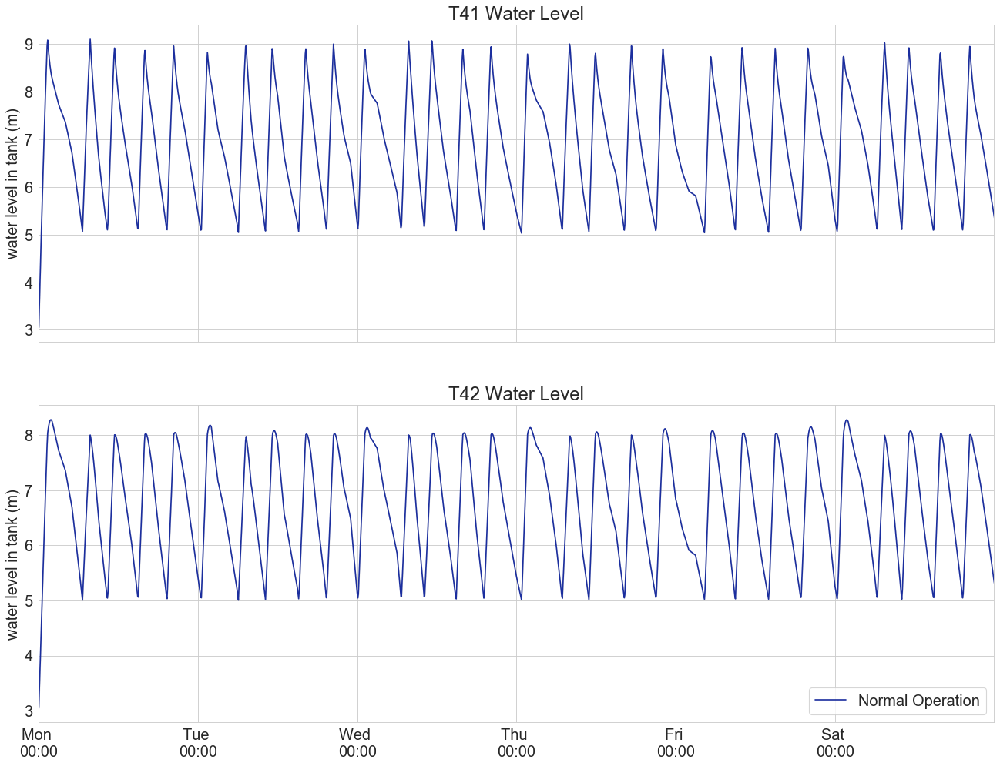

In [66]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([wntr_stand_alone[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [minimum_t41_wntr, minimum_t42_wntr], 
                   [maximum_t41_wntr, maximum_t42_wntr], plot_colors, 'envelope_wntr_alone', ['T41 Water Level', 'T42 Water Level'], linestyles=None, markers=None)

# EPANET Standalone envelop of variability

In [67]:
epanet_standalone = pd.read_csv('EPANET_alone/output/run_0.csv')

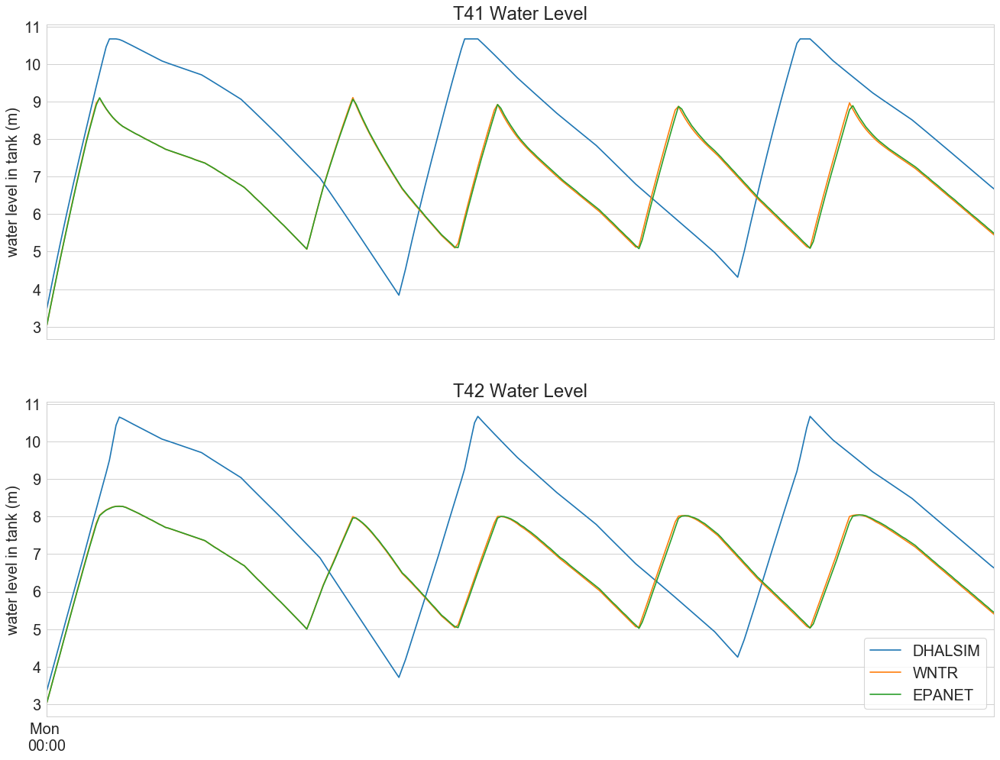

In [93]:
do_subplot([anytown_normal_new_skip_update_always, wntr_standalone, epanet_standalone], tanks,
           ['DHALSIM', 'WNTR', 'EPANET'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'dhalsim_wntr_epanet', y_label='water level in tank (m)', xlim=[0,288])

In [125]:
mixed = ['T41_LEVEL', 'P78_STATUS', 'P79_STATUS', 'T42_LEVEL']

In [96]:
mixed

[['T41_LEVEL', 'T42_LEVEL'], ['P78_STATUS', 'P79_STATUS']]

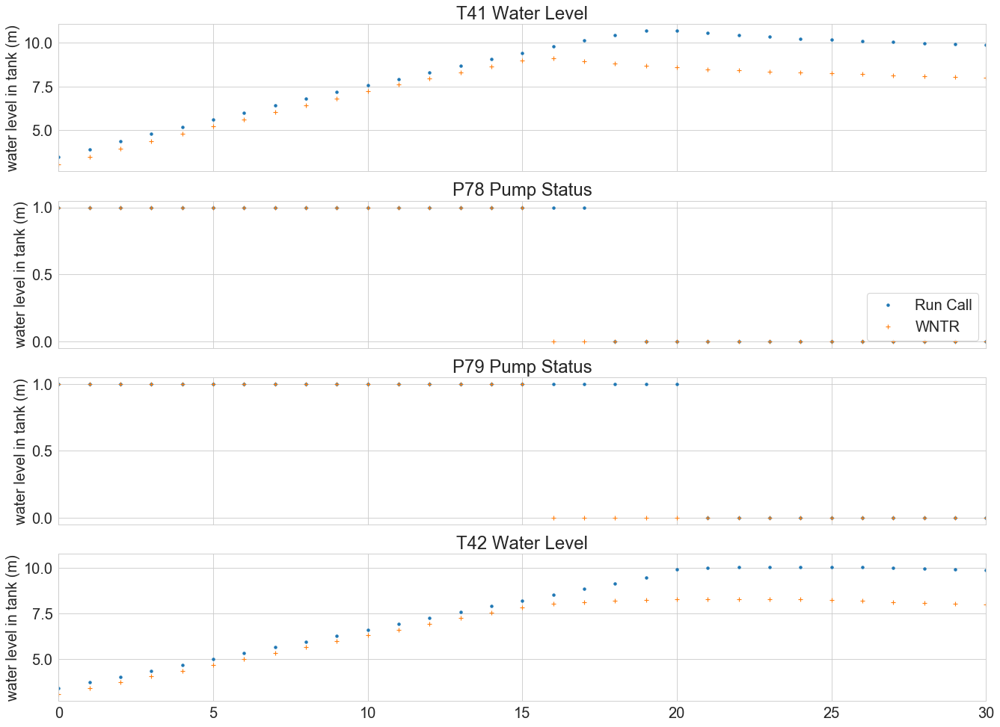

In [142]:
makers = ['.', '+', '*', 1]
do_subplot([run_26_november, wntr_standalone], mixed,
           ['Run Call', 'WNTR'], titles=['T41 Water Level', 'P78 Pump Status',  'P79 Pump Status', 'T42 Water Level'],
           sub_filename = 'dhalsim_wntr_pumps', y_label='water level in tank (m)', xlim=[0,30], markers=makers)

In [69]:
folder_prefix = 'EPANET_alone/output/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

epanet_stand_alone = []

for file in paths:     
    epanet_stand_alone.append(pd.read_csv(file))
    
t41_epanet = pd.concat([pd.Series(epanet_stand_alone[0]['T41_LEVEL'].values),
                        pd.Series(epanet_stand_alone[1]['T41_LEVEL'].values),                          
                        pd.Series(epanet_stand_alone[2]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
t42_epanet = pd.concat([pd.Series(epanet_stand_alone[0]['T42_LEVEL'].values),
                        pd.Series(epanet_stand_alone[1]['T42_LEVEL'].values),                          
                        pd.Series(epanet_stand_alone[2]['T42_LEVEL'].values)],axis=1)

In [70]:
maximum_t41_epanet = t41_epanet.max(axis=1)
minimum_t41_epanet = t41_epanet.min(axis=1)

maximum_t42_epanet = t42_epanet.max(axis=1)
minimum_t42_epanet = t42_epanet.min(axis=1)

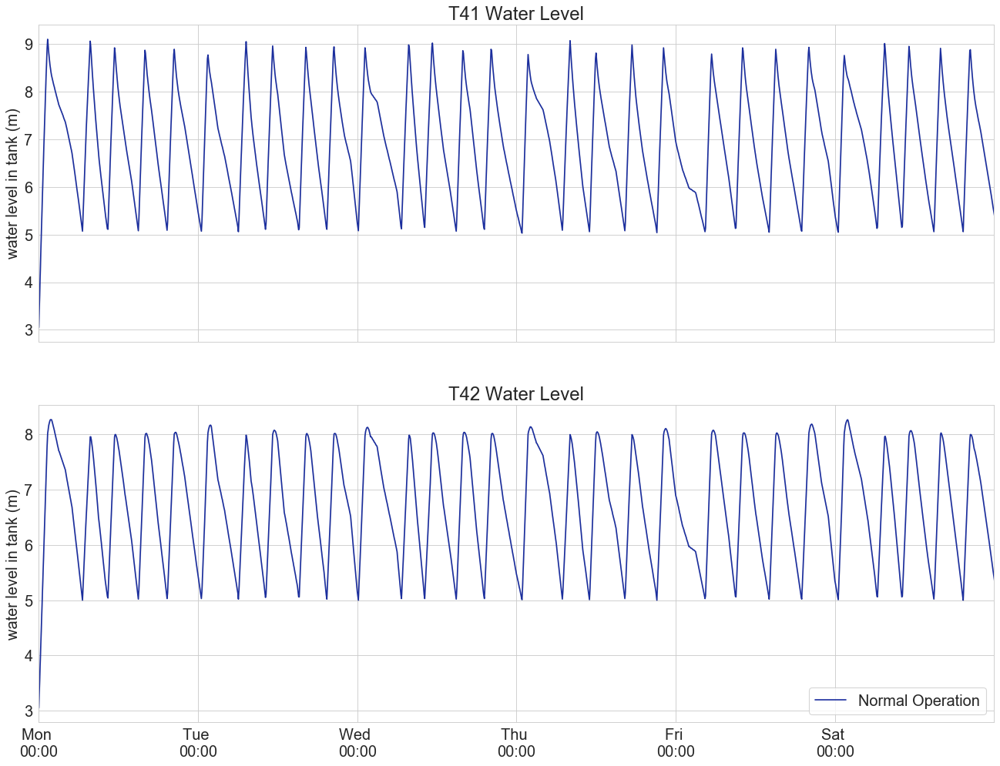

In [71]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([epanet_stand_alone[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [minimum_t41_epanet, minimum_t42_epanet], 
                   [maximum_t41_epanet, maximum_t42_epanet], plot_colors, 'envelope_epanet_alone', ['T41 Water Level', 'T42 Water Level'], linestyles=None, markers=None)

# Testing with a very low demand

In [74]:
low_demand = pd.read_csv('normal_new_skip_update_always_low_demand/run_0/output/ground_truth.csv')

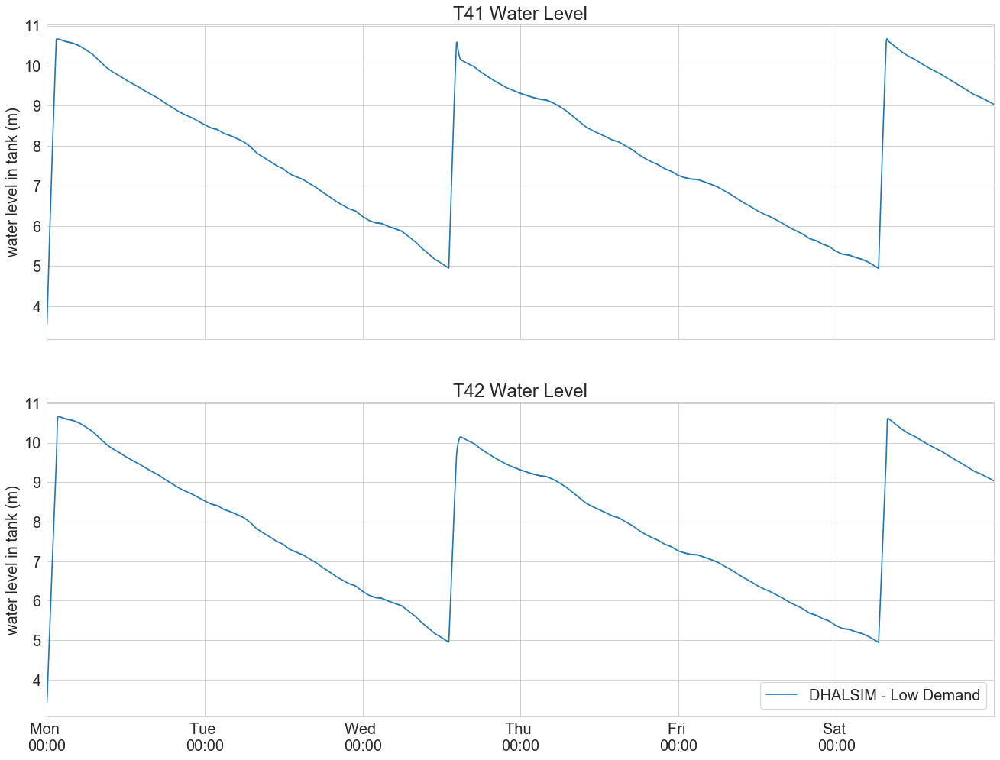

In [75]:
do_subplot([low_demand], tanks,
           ['DHALSIM - Low Demand'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'dhalsim_low_demand', y_label='water level in tank (m)')

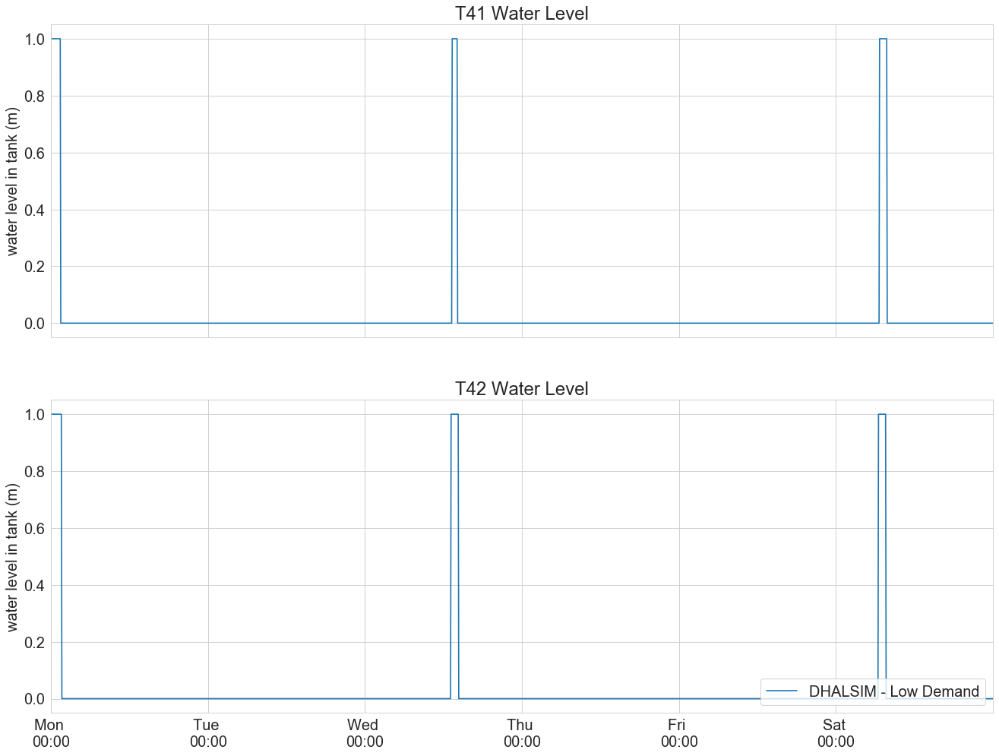

In [76]:
do_subplot([low_demand], pumps,
           ['DHALSIM - Low Demand'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'dhalsim_low_demand', y_label='water level in tank (m)')

In [77]:
folder_prefix = 'normal_new_skip_update_always_low_demand/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

low_demand_runs = []

for file in paths:     
    low_demand_runs.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
t41_low_demand = pd.concat([pd.Series(low_demand_runs[0]['T41_LEVEL'].values),
                            pd.Series(low_demand_runs[1]['T41_LEVEL'].values), 
                            pd.Series(low_demand_runs[2]['T41_LEVEL'].values),
                            pd.Series(low_demand_runs[3]['T41_LEVEL'].values),
                            pd.Series(low_demand_runs[4]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
t42_low_demand= pd.concat([pd.Series(low_demand_runs[0]['T42_LEVEL'].values),
                           pd.Series(low_demand_runs[1]['T42_LEVEL'].values),
                           pd.Series(low_demand_runs[2]['T42_LEVEL'].values),
                           pd.Series(low_demand_runs[3]['T42_LEVEL'].values),
                           pd.Series(low_demand_runs[4]['T42_LEVEL'].values)],axis=1)

maximum_t41_low_demand = t41_low_demand.max(axis=1)
minimum_t41_low_demand = t41_low_demand.min(axis=1)

maximum_t42_low_demand = t42_low_demand.max(axis=1)
minimum_t42_low_demand = t42_low_demand.min(axis=1)

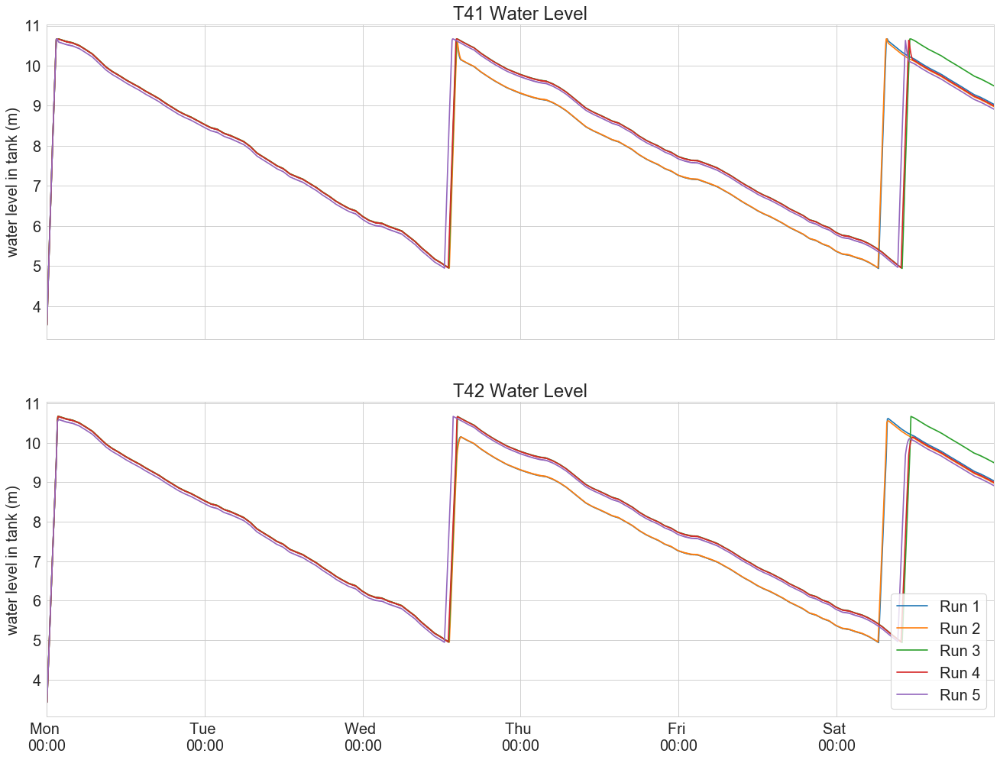

In [78]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([low_demand_runs[0], low_demand_runs[1], low_demand_runs[2], low_demand_runs[3], low_demand_runs[4]], tanks,
           ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'low_demand', y_label='water level in tank (m)')

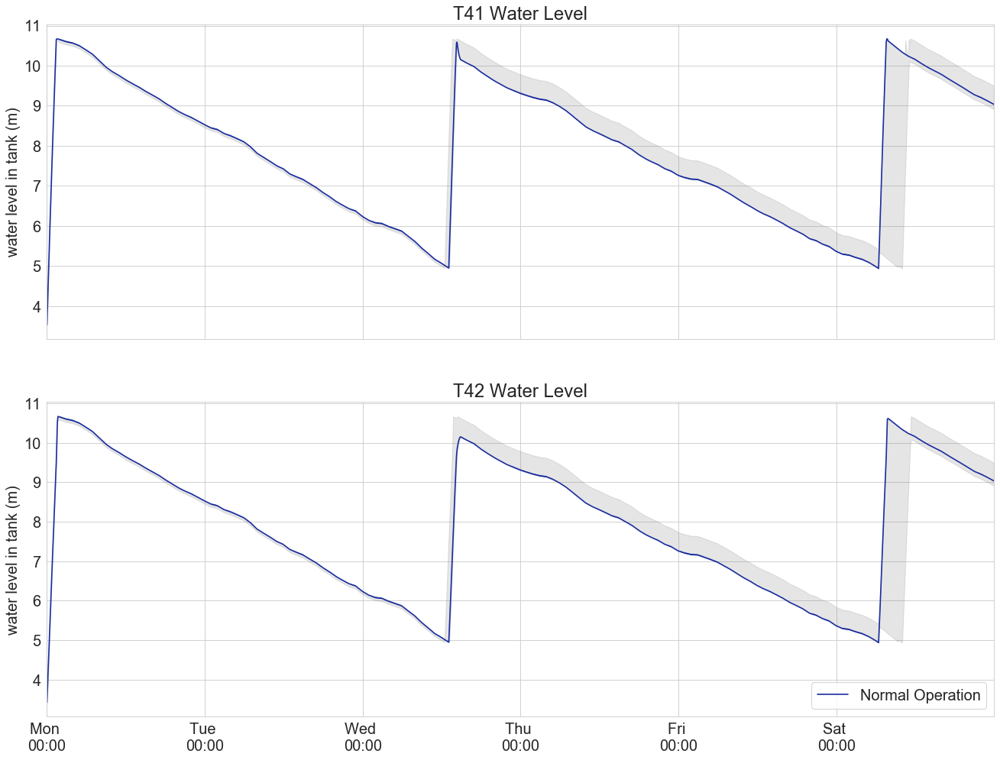

In [79]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([low_demand_runs[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [minimum_t41_low_demand, minimum_t42_low_demand], 
                   [maximum_t41_low_demand, maximum_t42_low_demand], plot_colors, 'envelope_low_demand', ['T41 Water Level', 'T42 Water Level'], linestyles=None, markers=None)

# Same as before, but Normal Demand and Sleep 0.1s in physical process

In [80]:
folder_prefix = 'normal_new_skip_update_always_seed_sleep_0_1/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

sleep_0_1 = []

for file in paths:     
    sleep_0_1.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
t41_sleep_0_1 = pd.concat([pd.Series(sleep_0_1[0]['T41_LEVEL'].values),
                           pd.Series(sleep_0_1[1]['T41_LEVEL'].values),
                           pd.Series(sleep_0_1[2]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
t42_sleep_0_1= pd.concat([pd.Series(sleep_0_1[0]['T42_LEVEL'].values),
                          pd.Series(sleep_0_1[1]['T42_LEVEL'].values),
                          pd.Series(sleep_0_1[2]['T42_LEVEL'].values)],axis=1)

maximum_t41_sleep_0_1 = t41_sleep_0_1.max(axis=1)
minimum_t41_sleep_0_1 = t41_sleep_0_1.min(axis=1)

maximum_t42_sleep_0_1 = t42_sleep_0_1.max(axis=1)
minimum_t42_sleep_0_1 = t42_sleep_0_1.min(axis=1)

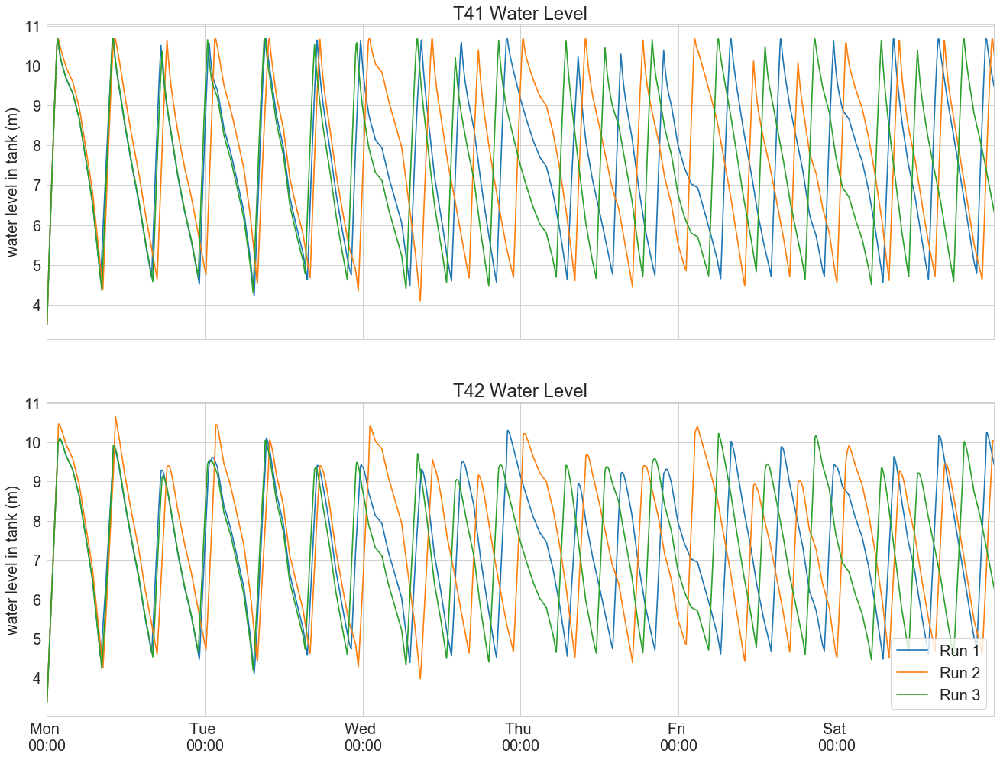

In [81]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([sleep_0_1[0], sleep_0_1[1], sleep_0_1[2]], tanks,['Run 1', 'Run 2', 'Run 3'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'sleep_0_1', y_label='water level in tank (m)')

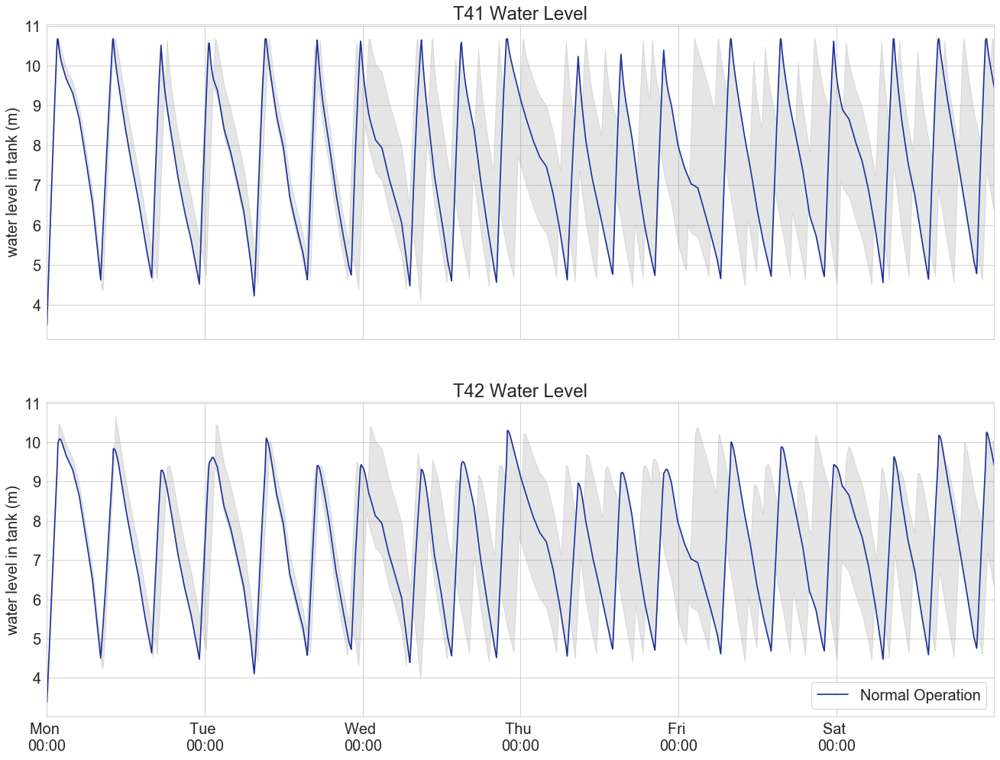

In [82]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([sleep_0_1[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [minimum_t41_sleep_0_1, minimum_t42_sleep_0_1], 
                   [maximum_t41_sleep_0_1, maximum_t42_sleep_0_1], plot_colors, 'envelope_sleep_0_1', ['T41 Water Level', 'T42 Water Level'], linestyles=None, markers=None)

# Same as before, but Normal Demand and Sleep 0.1s in physical process

In [83]:
folder_prefix = 'normal_new_skip_update_always_seed_sleep_0_3/'
file_expr = folder_prefix + '*'
paths = glob.glob(file_expr)

sleep_0_3 = []

for file in paths:     
    sleep_0_3.append(pd.read_csv(file + '/output/ground_truth.csv'))
    
t41_sleep_0_3 = pd.concat([pd.Series(sleep_0_3[0]['T41_LEVEL'].values),
                           pd.Series(sleep_0_3[1]['T41_LEVEL'].values),
                           pd.Series(sleep_0_3[2]['T41_LEVEL'].values)],axis=1)

# We are in a rush, later find an elegant solution
t42_sleep_0_3= pd.concat([pd.Series(sleep_0_3[0]['T42_LEVEL'].values),
                          pd.Series(sleep_0_3[1]['T42_LEVEL'].values),
                          pd.Series(sleep_0_3[2]['T42_LEVEL'].values)],axis=1)

maximum_t41_sleep_0_3 = t41_sleep_0_3.max(axis=1)
minimum_t41_sleep_0_3 = t41_sleep_0_3.min(axis=1)

maximum_t42_sleep_0_3 = t42_sleep_0_3.max(axis=1)
minimum_t42_sleep_0_3 = t42_sleep_0_3.min(axis=1)

In [136]:
run_26_november = pd.read_csv('november_26_run/output/ground_truth.csv')

TypeError: 'NoneType' object is not subscriptable

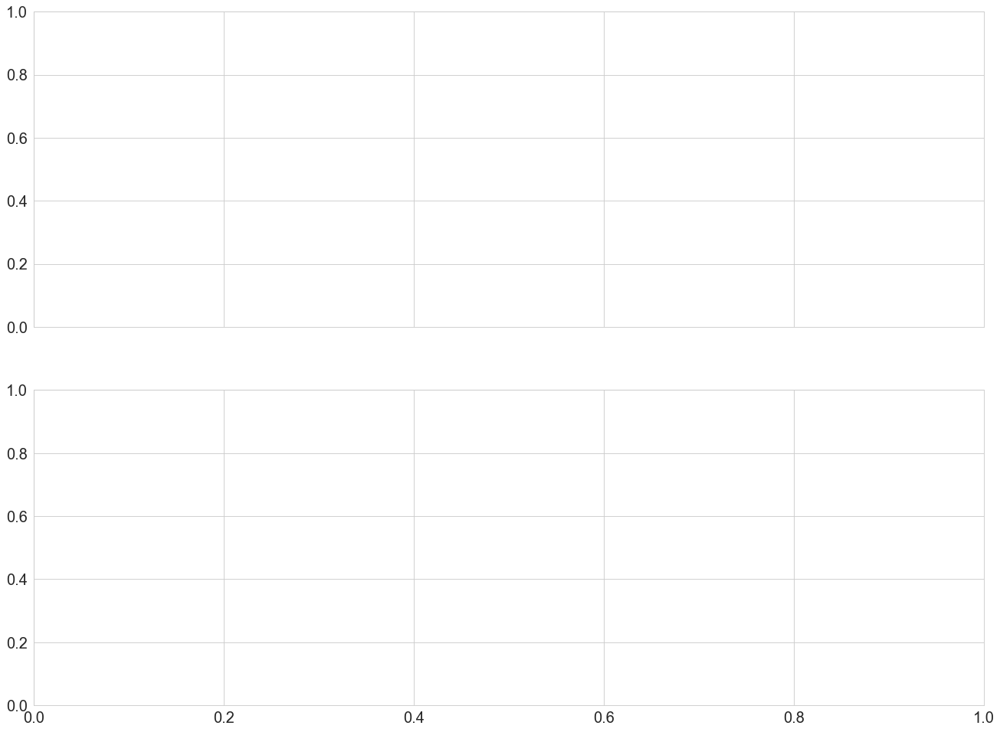

In [137]:
tanks = ['T41_LEVEL', 'T42_LEVEL']
do_subplot([sleep_0_3[0], run_26_november], tanks,['Run 1', 'Run Call'], titles=['T41 Water Level', 'T42 Water Level'],
           sub_filename = 'run_call', y_label='water level in tank (m)')

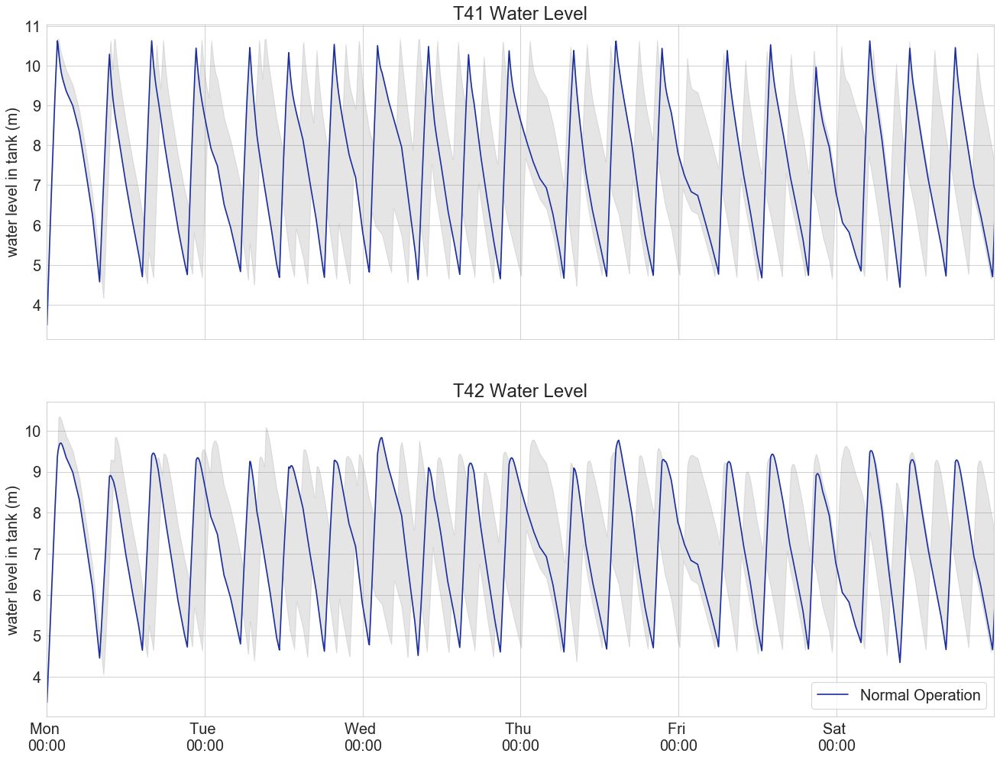

In [85]:
plot_colors = ['#1b2e9e', '#d12b75', '#f69149', '#d4f482']
plot_with_envelope([sleep_0_3[0]], ['T41_LEVEL', 'T42_LEVEL'], ['Normal Operation'], 
                   [minimum_t41_sleep_0_3, minimum_t42_sleep_0_3], 
                   [maximum_t41_sleep_0_3, maximum_t42_sleep_0_3], plot_colors, 'envelope_sleep_0_3', ['T41 Water Level', 'T42 Water Level'], linestyles=None, markers=None)